## 17-4. 내가 원하는 숫자 이미지 만들기 (1) Generator 구성하기

### 데이터 준비하기

In [11]:
# https://github.com/thisisiron/TF2-GAN

In [12]:
# !pip install tensorflow-dataset

In [13]:
import tensorflow_datasets as tfds


# mnist, info =  tfds.load(
#     "mnist", split="train", with_info=True
# )

# fig = tfds.show_examples(mnist, info)

In [14]:
import tensorflow as tf

# BATCH_SIZE = 128

# def gan_preprocessing(data):
#     image = data["image"]
#     image = tf.cast(image, tf.float32)
#     image = (image / 127.5) - 1
#     return image

# def cgan_preprocessing(data):
#     image = data["image"]
#     image = tf.cast(image, tf.float32)
#     image = (image / 127.5) - 1
    
#     label = tf.one_hot(data["label"], 10)
#     return image, label

# gan_datasets = mnist.map(gan_preprocessing).shuffle(1000).batch(BATCH_SIZE)
# cgan_datasets = mnist.map(cgan_preprocessing).shuffle(100).batch(BATCH_SIZE)
# print("✅")

In [15]:
import matplotlib.pyplot as plt

# for i,j in cgan_datasets : break

# # 이미지 i와 라벨 j가 일치하는지 확인해 봅니다.     
# print("Label :", j[0])
# print("Image Min/Max :", i.numpy().min(), i.numpy().max())
# plt.imshow(i.numpy()[0,...,0], plt.cm.gray)

#### GAN Generator 구성하기

In [16]:
from tensorflow.keras import layers, Input, Model

# class GeneratorGAN(Model):
#     def __init__(self):
#         super(GeneratorGAN, self).__init__()

#         self.dense_1 = layers.Dense(128, activation='relu')
#         self.dense_2 = layers.Dense(256, activation='relu')
#         self.dense_3 = layers.Dense(512, activation='relu')
#         self.dense_4 = layers.Dense(28*28*1, activation='tanh')

#         self.reshape = layers.Reshape((28, 28, 1))

#     def call(self, noise):
#         out = self.dense_1(noise)
#         out = self.dense_2(out)
#         out = self.dense_3(out)
#         out = self.dense_4(out)
#         return self.reshape(out)

# print("✅")

#### cGAN Generator 구성하기

In [17]:
# class GeneratorCGAN(Model):
#     def __init__(self):
#         super(GeneratorCGAN, self).__init__()
        
#         self.dense_z = layers.Dense(256, activation='relu')
#         self.dense_y = layers.Dense(256, activation='relu')
#         self.combined_dense = layers.Dense(512, activation='relu')
#         self.final_dense = layers.Dense(28 * 28 * 1, activation='tanh')
#         self.reshape = layers.Reshape((28, 28, 1))

#     def call(self, noise, label):
#         noise = self.dense_z(noise)
#         label = self.dense_y(label)
#         out = self.combined_dense(tf.concat([noise, label], axis=-1))
#         out = self.final_dense(out)
#         return self.reshape(out)
    
# print("✅")

## 17-5. 내가 원하는 숫자 이미지 만들기 (2) Discriminator 구성하기

#### GAN Discriminator 구성하기

In [18]:
# class DiscriminatorGAN(Model):
#     def __init__(self):
#         super(DiscriminatorGAN, self).__init__()
#         self.flatten = layers.Flatten()
        
#         self.blocks = []
#         for f in [512, 256, 128, 1]:
#             self.blocks.append(
#                 layers.Dense(f, activation=None if f==1 else "relu")
#             )
        
#     def call(self, x):
#         x = self.flatten(x)
#         for block in self.blocks:
#             x = block(x)
#         return x
    
# print("✅")

#### cGAN Discriminator 구성하기

cGAN의 Discriminator는 Maxout이라는레이어가 사용됨

![](https://d3s0tskafalll9.cloudfront.net/media/images/e-25-4-1.max-800x600.png)

![](https://d3s0tskafalll9.cloudfront.net/media/original_images/e-25-4-2.png)

2개의 fully-connected 레이어를 사용할 때 Maxout을 식으로 표현

$$max(w_1^Tx+b_1,\ w_2^Tx+b_2)$$

In [19]:
# class Maxout(layers.Layer):
#     def __init__(self, units, pieces):
#         super(Maxout, self).__init__()
#         self.dense = layers.Dense(units*pieces, activation="relu")
#         self.dropout = layers.Dropout(.5)    
#         self.reshape = layers.Reshape((-1, pieces, units))
    
#     def call(self, x):
#         x = self.dense(x)
#         x = self.dropout(x)
#         x = self.reshape(x)
#         return tf.math.reduce_max(x, axis=2)

# print("✅")

In [20]:
# class DiscriminatorCGAN(Model):
#     def __init__(self):
#         super(DiscriminatorCGAN, self).__init__()
#         self.flatten = layers.Flatten()
        
#         self.image_block = Maxout(240, 5)
#         self.label_block = Maxout(50, 5)
#         self.combine_block = Maxout(240, 4)
        
#         self.dense = layers.Dense(1, activation=None)
    
#     def call(self, image, label):
#         image = self.flatten(image)
#         image = self.image_block(image)
#         label = self.label_block(label)
#         x = layers.Concatenate()([image, label])
#         x = self.combine_block(x)
#         return self.dense(x)
    
# print("✅")

## 17-6. 내가 원하는 숫자 이미지 만들기 (3) 학습 및 테스트하기

#### GAN, cGAN 각각의 모델 학습에 공통적으로 필요한 loss function과 optimizer를 정의

In [21]:
from tensorflow.keras import optimizers, losses

# bce = losses.BinaryCrossentropy(from_logits=True)

# def generator_loss(fake_output):
#     return bce(tf.ones_like(fake_output), fake_output)

# def discriminator_loss(real_output, fake_output):
#     return bce(tf.ones_like(real_output), real_output) + bce(tf.zeros_like(fake_output), fake_output)

# gene_opt = optimizers.Adam(1e-4)
# disc_opt = optimizers.Adam(1e-4)    
 




# print("✅")

#### GAN으로 MNIST 학습하기

In [22]:
# gan_generator = GeneratorGAN()
# gan_discriminator = DiscriminatorGAN()

# @tf.function()
# def gan_step(real_images):
#     noise = tf.random.normal([real_images.shape[0], 100])
    
#     with tf.GradientTape(persistent=True) as tape:
#         # Generator를 이용해 가짜 이미지 생성
#         fake_images = gan_generator(noise)
#         # Discriminator를 이용해 진짜 및 가짜이미지를 각각 판별
#         real_out = gan_discriminator(real_images)
#         fake_out = gan_discriminator(fake_images)
#         # 각 손실(loss)을 계산
#         gene_loss = generator_loss(fake_out)
#         disc_loss = discriminator_loss(real_out, fake_out)
#     # gradient 계산
#     gene_grad = tape.gradient(gene_loss, gan_generator.trainable_variables)
#     disc_grad = tape.gradient(disc_loss, gan_discriminator.trainable_variables)
#     # 모델 학습
#     gene_opt.apply_gradients(zip(gene_grad, gan_generator.trainable_variables))
#     disc_opt.apply_gradients(zip(disc_grad, gan_discriminator.trainable_variables))
#     return gene_loss, disc_loss

# print("✅")

In [23]:
# EPOCHS = 1
# for epoch in range(1, EPOCHS+1):
#     for i, images in enumerate(gan_datasets):
#         gene_loss, disc_loss = gan_step(images)

#         if (i+1) % 100 == 0:
#             print(f"[{epoch}/{EPOCHS} EPOCHS, {i+1} ITER] G:{gene_loss}, D:{disc_loss}")

In [24]:
# import numpy as np

# noise = tf.random.normal([10, 100])

# output = gan_generator(noise)
# output = np.squeeze(output.numpy())

# plt.figure(figsize=(15,6))
# for i in range(1, 11):
#     plt.subplot(2,5,i)
#     plt.imshow(output[i-1])

In [25]:
# !mkdir -p ~/aiffel/conditional_generation/gan
# !cp ~/data/gan/GAN_500.zip ~/aiffel/conditional_generation/gan/
# !cd ~/aiffel/conditional_generation/gan && unzip GAN_500.zip

In [26]:
# #학습데이터 불러오기
# from pathlib import Path
# import os

# # weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/gan/GAN_500'
# weight_path = Path.joinpath(Path.cwd(),'gan','GAN_500')


# noise = tf.random.normal([10, 100]) 

# gan_generator = GeneratorGAN()
# gan_generator.load_weights(weight_path)

# output = gan_generator(noise)
# output = np.squeeze(output.numpy())

# plt.figure(figsize=(15,6))
# for i in range(1, 11):
#     plt.subplot(2,5,i)
#     plt.imshow(output[i-1])

#### cGAN으로 MNIST 학습하기

위에서 실행했던 GAN 학습처럼 약간의 학습으로는 제대로 된 생성 결과를 얻을 수 없음

In [27]:
# cgan_generator = GeneratorCGAN()
# cgan_discriminator = DiscriminatorCGAN()

# @tf.function()
# def cgan_step(real_images, labels):
#     noise = tf.random.normal([real_images.shape[0], 100])
    
#     with tf.GradientTape(persistent=True) as tape:
#         fake_images = cgan_generator(noise, labels)
        
#         real_out = cgan_discriminator(real_images, labels)
#         fake_out = cgan_discriminator(fake_images, labels)
        
#         gene_loss = generator_loss(fake_out)
#         disc_loss = discriminator_loss(real_out, fake_out)
    
#     gene_grad = tape.gradient(gene_loss, cgan_generator.trainable_variables)
#     disc_grad = tape.gradient(disc_loss, cgan_discriminator.trainable_variables)
    
#     gene_opt.apply_gradients(zip(gene_grad, cgan_generator.trainable_variables))
#     disc_opt.apply_gradients(zip(disc_grad, cgan_discriminator.trainable_variables))
#     return gene_loss, disc_loss


# EPOCHS = 1
# for epoch in range(1, EPOCHS+1):
    
#     for i, (images, labels) in enumerate(cgan_datasets):
#         gene_loss, disc_loss = cgan_step(images, labels)
    
#         if (i+1) % 100 == 0:
#             print(f"[{epoch}/{EPOCHS} EPOCHS, {i} ITER] G:{gene_loss}, D:{disc_loss}")

시간을 아끼기 위해 위 코드로 500 epoch 학습한 가중치를 불러옴

In [28]:
# !mkdir -p ~/aiffel/conditional_generation/cgan
# !cp ~/data/cgan/CGAN_500.zip ~/aiffel/conditional_generation/cgan/
# !cd ~/aiffel/conditional_generation/cgan && unzip CGAN_500.zip

In [29]:
# number =  0 # TODO : 생성할 숫자를 입력해 주세요!!

# # weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/cgan/CGAN_500'
# weight_path = Path.joinpath(Path.cwd(),'cgan','CGAN_500')
# noise = tf.random.normal([10, 100])

# label = tf.one_hot(number, 10)
# label = tf.expand_dims(label, axis=0)
# label = tf.repeat(label, 10, axis=0)

# generator = GeneratorCGAN()
# generator.load_weights(weight_path)

# output = generator(noise, label)
# output = np.squeeze(output.numpy())

# plt.figure(figsize=(15,6))
# for i in range(1, 11):
#     plt.subplot(2,5,i)
#     plt.imshow(output[i-1])

## 17-7. GAN의 입력에 이미지를 넣는다면? Pix2Pix

Pix2Pix는 이미지를 입력으로 하여 원하는 다른 형태의 이미지로 변환시킬 수 있는 GAN 모델

https://arxiv.org/pdf/1611.07004.pdf

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_results.max-800x600.png)

노이즈와 레이블 정보를 함께 입력했던 cGAN은 fully-connected 레이어를 연속적으로 쌓아 만들었지만, 이미지 변환이 목적인 Pix2Pix는 이미지를 다루는데 효율적인 convolution 레이어를 활용

#### Pix2Pix (Generator)

이미지를 입력받아 변환된 이미지를 출력 - 입력 이미지와 변환된 이미지의 크기는 동일

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_generator.max-800x600.png)

U-Net 구조

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_generator_unet.max-800x600.png)

Encoder와 Decoder가 연결(skip connection)되어있음.

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_result_loss.max-800x600.png)

https://medium.com/@msmapark2/u-net-%EB%85%BC%EB%AC%B8-%EB%A6%AC%EB%B7%B0-u-net-convolutional-networks-for-biomedical-image-segmentation-456d6901b28a

L1 이라 쓰여있는 Generator만으로 생성된 결과는 매우 흐릿합니다. 이미지를 변환하는데 L1(MAE)이나 L2(MSE) 손실만을 이용해서 학습하는 경우 이렇게 결과가 흐릿해지는 경향이 있습니다. Generator가 단순히 이미지의 평균적인 손실만을 줄이고자 파라미터를 학습하기 때문에 이러한 현상이 불가피합니다.

반면 위 그림의 cGAN이라 쓰여진 GAN 기반의 학습 방법은 비교적 훨씬 더 세밀한 정보를 잘 표현하고 있습니다. Discriminator를 잘 속이려면 Generator가 (Ground truth라고 쓰여진 이미지같이) 진짜 같은 이미지를 만들어야 하기 때문이죠. 논문에서는 L1손실과 GAN 손실을 같이 사용하면 더욱더 좋은 결과를 얻을 수 있다고 합니다 (위 그림의 L1+cGAN).

#### Pix2Pix (Loss Function)

DCGAN의 Discriminator

![](https://d3s0tskafalll9.cloudfront.net/media/original_images/dcgan_d.png)

DCGAN의 Discriminator는 진위만 판별

![](https://d3s0tskafalll9.cloudfront.net/media/images/patchgan.max-800x600.png)

Pix2Pix에서 사용되는 Discriminator는 하나의 값이 아닌 여러 개의 값으로 진위여부를 판단

PatchGAN - 서로 다른 영역에 대해 진짜/가짜를 나타내는 여러 개의 확률 값을 계산

#### 판별 영역을 다양한 크기로 실험한결과

![](https://d3s0tskafalll9.cloudfront.net/media/images/patchgan_results.max-800x600.png)

일반적으로 이미지에서 거리가 먼 두 픽셀은 서로 연관성이 거의 없기 때문에 특정 크기를 가진 일부 영역에 대해서 세부적으로 진짜/가짜를 판별하는 것이 Generator로 하여금 더 진짜 같은 이미지를 만들게 됨.

## 17-8. 난 스케치를 할 테니 너는 채색을 하거라 (1) 데이터 준비하기

데이터셋은 Sketch2Pokemon이라는 데이터셋

https://www.kaggle.com/norod78/sketch2pokemon

학습용 데이터 셋에 830개의 이미지가 있으며, 각 (256x256) 크기의 이미지 쌍이 나란히 붙어 (256x512) 크기의 이미지로 구성

In [30]:
# !mkdir -p ~/aiffel/conditional_generation/data
# !ln -s ~/data/sketch2pokemon.zip ~/aiffel/conditional_generation/data
# !cd ~/aiffel/conditional_generation/data && unzip sketch2pokemon.zip

In [31]:
import os
# # data_path = os.getenv('HOME')+'/aiffel/conditional_generation/data/pokemon_pix2pix_dataset/train/'
# # data_path = Path.joinpath(Path.cwd(),''data','pokemon_pix2pix_dataset',train')
# data_path = 'data\\pokemon_pix2pix_dataset\\train\\'
# print(data_path)

# print("number of train examples :", len(os.listdir(data_path)))

In [32]:
# !pip3 install opencv-python

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# plt.figure(figsize=(20,15))
# for i in range(1, 7):
#     f = data_path + os.listdir(data_path)[np.random.randint(800)]
#     img = cv2.imread(f, cv2.IMREAD_COLOR)
#     plt.subplot(3,2,i)
#     plt.imshow(img)

In [34]:
# type(os.listdir(data_path)[np.random.randint(800)])

스케치 생성 모델을 이용해서 만든 그림들

 첫 번째 스케치를 다음 단계에서 구성할 Pix2Pix 모델에 입력하여 두 번째 그림과 같은 채색된 이미지를 생성하는 것이 이번 단계의 목표

In [35]:
import tensorflow as tf

# def normalize(x):
#     x = tf.cast(x, tf.float32)
#     return (x/127.5) - 1

# def denormalize(x):
#     x = (x+1)*127.5
#     x = x.numpy()
#     return x.astype(np.uint8)

# def load_img(img_path):
#     img = tf.io.read_file(img_path)
#     img = tf.image.decode_image(img, 3)
    
#     w = tf.shape(img)[1] // 2
#     sketch = img[:, :w, :] 
#     sketch = tf.cast(sketch, tf.float32)
#     colored = img[:, w:, :] 
#     colored = tf.cast(colored, tf.float32)
#     return normalize(sketch), normalize(colored)

# f = data_path + os.listdir(data_path)[1]

# sketch, colored = load_img(f)

# plt.figure(figsize=(10,7))
# plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
# plt.subplot(1,2,2); plt.imshow(denormalize(colored))

데이터의 다양성을 높이기 위해 아래 코드와 같이 여러 augmentation 방법을 적용

In [36]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

# @tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
# def apply_augmentation(sketch, colored):
#     stacked = tf.concat([sketch, colored], axis=-1)
    
#     _pad = tf.constant([[30,30],[30,30],[0,0]])
#     if tf.random.uniform(()) < .5:
#         padded = tf.pad(stacked, _pad, "REFLECT")
#     else:
#         padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

#     out = image.random_crop(padded, size=[256, 256, 6])
    
#     out = image.random_flip_left_right(out)
#     out = image.random_flip_up_down(out)
    
#     if tf.random.uniform(()) < .5:
#         degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
#         out = image.rot90(out, k=degree)
    
#     return out[...,:3], out[...,3:]   

# print("✅")

In [37]:
# plt.figure(figsize=(15,13))
# img_n = 1
# for i in range(1, 13, 2):
#     augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
#     plt.subplot(3,4,i)
#     plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
#     plt.subplot(3,4,i+1); 
#     plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
#     img_n += 1

In [38]:
# from tensorflow import data

# def get_train(img_path):
#     sketch, colored = load_img(img_path)
#     sketch, colored = apply_augmentation(sketch, colored)
#     return sketch, colored

# train_images = data.Dataset.list_files(data_path + "*.jpg")
# train_images = train_images.map(get_train).shuffle(100).batch(4)

# sample = train_images.take(1)
# sample = list(sample.as_numpy_iterator())
# sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

# plt.figure(figsize=(10,5))
# plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
# plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

## 17-9. 난 스케치를 할 테니 너는 채색을 하거라 (2) Generator 구성하기

Generator의 구성요소 알아보기

pix2pix 논문에서 Generator를 구성하는데 필요한 정보

![](https://d3s0tskafalll9.cloudfront.net/media/images/refer_g.max-800x600.png)

입출력 크기를 주의 깊게 보기 바람

Generator 구현하기

In [39]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

print("✅")

✅


In [40]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")


✅


In [41]:
# Encoder().get_summary()

 Decoder 정의

In [42]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,512)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")
# Decoder().get_summary()

✅


tf.keras.Model을 상속받아 Encoder와 Decoder를 연결해 Generator를 구성

In [43]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        

# EncoderDecoderGenerator().get_summary()

## 17-10. 난 스케치를 할 테니 너는 채색을 하거라 (3) Generator 재구성하기

In [44]:
# class EncodeBlock(layers.Layer):
#     def __init__(self, n_filters, use_bn=True):
#         super(EncodeBlock, self).__init__()
#         self.use_bn = use_bn       
#         self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
#         self.batchnorm = layers.BatchNormalization()
#         self.lrelu = layers.LeakyReLU(0.2)

#     def call(self, x):
#         x = self.conv(x)
#         if self.use_bn:
#             x = self.batchnorm(x)
#         return self.lrelu(x)

    
# class DecodeBlock(layers.Layer):
#     def __init__(self, f, dropout=True):
#         super(DecodeBlock, self).__init__()
#         self.dropout = dropout
#         self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
#         self.batchnorm = layers.BatchNormalization()
#         self.relu = layers.ReLU()
        
#     def call(self, x):
#         x = self.Transconv(x)
#         x = self.batchnorm(x)
#         if self.dropout:
#             x = layers.Dropout(.5)(x)
#         return self.relu(x)
    
# print("✅")

U-Net Generator를 정의

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_result_g2.max-800x600.png)

Encoder와 Decoder 사이를 skip connection으로 연결한 U-Net 구조를 사용한 결과가 훨씬 좋음

In [45]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
#         self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", activation='tanh', use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


## 17-11. 난 스케치를 할 테니 너는 채색을 하거라 (4) Discriminator 구성하기

Discriminator의 구성요소 알아보기

![](https://d3s0tskafalll9.cloudfront.net/media/images/refer_d.max-800x600.png)

 최종 출력 크기가 (30,30,1)이 되어야 하는 이유는 앞서 Discriminator에 대해 알아봤던 70x70 PatchGAN을 사용했기 때문입니다. 최종 (30,30) 출력에서 각 픽셀의 receptive field 크기를 (70,70)으로 맞추기 위해 Discriminator의 출력 크기를 (30,30) 크기로 강제로 맞추는 과정입니다.

https://sahiltinky94.medium.com/understanding-patchgan-9f3c8380c207

Discriminator 구현하기

In [46]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


In [47]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

# Model(inputs, out).summary()

Pix2Pix의 Discriminator가 70x70 PatchGAN을 사용하기 때문에 최종 출력을 (30,30) 크기로 맞추느라 위와 같이 조금 복잡한 과정을 거침

In [48]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


In [49]:
# Discriminator().get_summary()

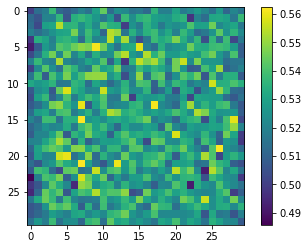

In [50]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

## 17-12. 난 스케치를 할 테니 너는 채색을 하거라 (5) 학습 및 테스트하기

손실 함수 선택에 따른 결과의 차이

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_result_loss2.max-800x600.png)

일반적인 GAN의 손실 함수에 L1을 추가로 이용했을 때 결과가 좋음

In [51]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)

# bce = losses.BinaryCrossentropy(from_logits=True)

mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


In [52]:
# from tensorflow.python.ops.losses import losses
# from tensorflow.python.framework import ops
# from tensorflow.python.ops import array_ops

# def generator_loss(fake_output):
# #     return cross_entropy(tf.ones_like(fake_output), fake_output)
#     label_smoothing=0.0
#     weights=1.0
#     scope=None
#     loss_collection=ops.GraphKeys.LOSSES
#     reduction=losses.Reduction.SUM_BY_NONZERO_WEIGHTS

#     loss = losses.sigmoid_cross_entropy(
#         array_ops.ones_like(fake_output),
#         fake_output, weights, label_smoothing, scope,
#         loss_collection, reduction)
    
#     return loss


# def discriminator_loss(real_output, fake_output):
# # def discriminator_loss(real_output, fake_output, weights): ###
    
    
# #     real_weights      = weights['real'][-1]          ###
# #     generated_weights = weights['generated'][-1]     ###
#     real_weights      = 1.2
#     generated_weights = 1.0
#     label_smoothing=0.25
#     loss_collection=ops.GraphKeys.LOSSES
#     reduction=losses.Reduction.SUM_BY_NONZERO_WEIGHTS
#     add_summaries=False

#     # -log((1 - label_smoothing) - sigmoid(D(x)))
#     loss_on_real = losses.sigmoid_cross_entropy(
#         array_ops.ones_like(real_output),
#         real_output, real_weights, label_smoothing,
#         reduction=reduction)
#     # -log(- sigmoid(D(G(x))))
#     loss_on_generated = losses.sigmoid_cross_entropy(
#         array_ops.zeros_like(fake_output),
#         fake_output, generated_weights,
#         reduction=reduction)

#     loss = loss_on_real + loss_on_generated
#     return loss

In [53]:
# def generator_loss(disc_generated_output, gen_output, target):
#     gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
#     # mean absolute error
#     l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
#     total_gen_loss = gan_loss + (LAMBDA * l1_loss)
#     return total_gen_loss, gan_loss, l1_loss


# def discriminator_loss(disc_real_output, disc_generated_output):
#     real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
#     generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
#     total_disc_loss = real_loss + generated_loss
#     return total_disc_loss

Generator의 손실 함수 (위 코드의 get_gene_loss)는 총 3개의 입력이 있습니다. 이 중 fake_disc는 Generator가 생성한 가짜 이미지를 Discriminator에 입력하여 얻어진 값이며, 실제 이미지를 뜻하는 "1"과 비교하기 위해 tf.ones_like()를 사용합니다. 또한 L1 손실을 계산하기 위해 생성한 가짜 이미지(fake_output)와 실제 이미지(real_output) 사이의 MAE(Mean Absolute Error)를 계산합니다.

Discriminator의 손실 함수 (위 코드의 get_disc_loss)는 2개의 입력이 있으며, 이들은 가짜 및 진짜 이미지가 Discriminator에 각각 입력되어 얻어진 값입니다. Discriminator는 실제 이미지를 잘 구분해 내야 하므로 real_disc는 "1"로 채워진 벡터와 비교하고, fake_disc는 "0"으로 채워진 벡터와 비교합니다.

In [54]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(5e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


In [55]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


논문에서는 Generator의 손실을 아래와 같이 정의했습니다.

$$G^* = \arg \min_G \max_D \mathcal{L}_{cGAN}(G,D) + \lambda \mathcal{L}_{L1}(G)$$

λλ는 학습 과정에서 L1 손실을 얼마나 반영할 것인지를 나타내며 논문에서는 λ=100λ=100을 사용

In [56]:
# EPOCHS = 1

# generator = UNetGenerator()
# discriminator = Discriminator()

# for epoch in range(1, EPOCHS+1):
#     for i, (sketch, colored) in enumerate(train_images):
#         g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
#         # 10회 반복마다 손실을 출력합니다.
#         if (i+1) % 10 == 0:
#             print(f"EPOCH[{epoch}] - STEP[{i+1}] \
#                     \nGenerator_loss:{g_loss.numpy():.4f} \
#                     \nL1_loss:{l1_loss.numpy():.4f} \
#                     \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

In [57]:
# test_ind = 1

# f = data_path + os.listdir(data_path)[test_ind]
# sketch, colored = load_img(f)

# pred = generator(tf.expand_dims(sketch, 0))
# pred = denormalize(pred)

# plt.figure(figsize=(20,10))
# plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
# plt.subplot(1,3,2); plt.imshow(pred[0])
# plt.subplot(1,3,3); plt.imshow(denormalize(colored))

 이렇게 Encoder-Decoder Generator, U-Net Generator, Discriminator의 구현했음.

## 17-13. 프로젝트 : Segmentation map으로 도로 이미지 만들기

도로의 레이블 정보를 활용해 이미지를 생성

![](https://d3s0tskafalll9.cloudfront.net/media/images/p2p_result_seg.max-800x600.png)

https://d3s0tskafalll9.cloudfront.net/media/documents/cityscapes.zip

1000개의 학습용 이미지 및 5개의 평가 이미지를 포함

Tensroflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.

https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko

In [58]:
import numpy
import tensorflow

print(numpy.__version__)
print(tensorflow.__version__)

1.22.2
2.8.0


# 프로젝트 수행

데이터에 한 가지 이상의 augmentation 방법을 적용하여 학습해 주세요.
(어떠한 방법을 사용했는지 적어주세요.)  
이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 U-Net Generator를 사용해 주세요.  
모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운로드했던 "val" 폴더 내 이미지를 사용해 주세요.  
1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화해 주세요.  
모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 중간 손실 값에 대한 로그를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

## (1) 데이터 준비하기

In [59]:
import os

# data_path = Path.joinpath(Path.cwd(),''cityscapes','train')

# data_path = 'cityscapes\\train\\'
data_path = 'data\\pokemon_pix2pix_dataset\\train\\'


print(data_path)

print("number of train examples :", len(os.listdir(data_path)))

data\pokemon_pix2pix_dataset\train\
number of train examples : 830


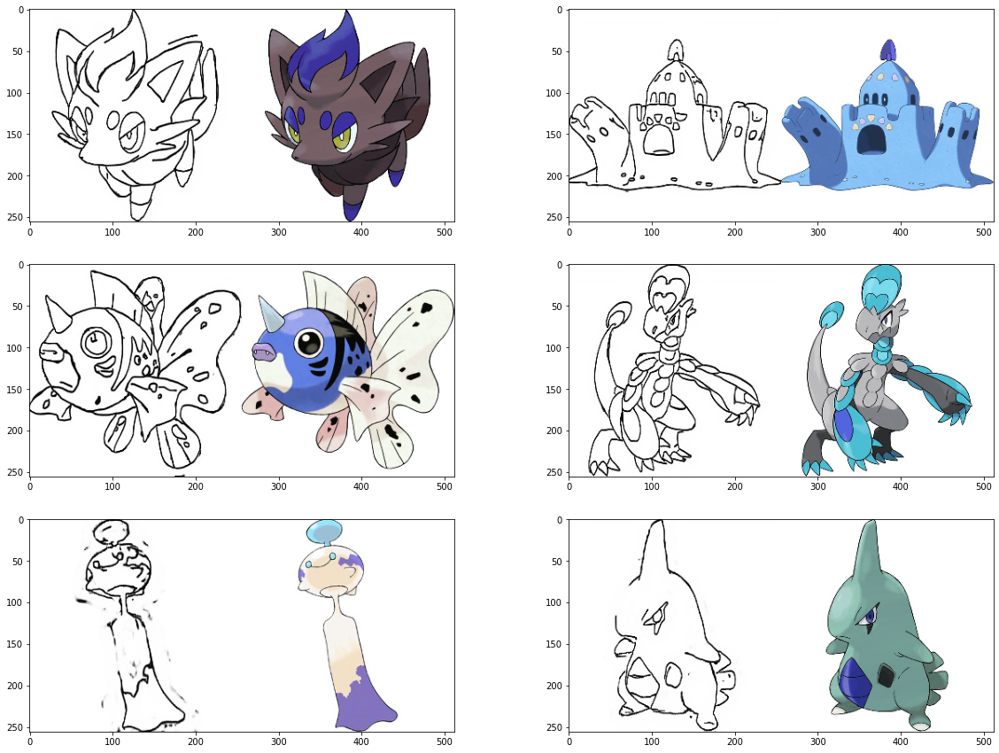

In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

두 번째 그림을 Pix2Pix 모델에 입력하여 첫 번째 스케치와 같은 채색된 이미지를 생성하는 것이 이번 단계의 목표

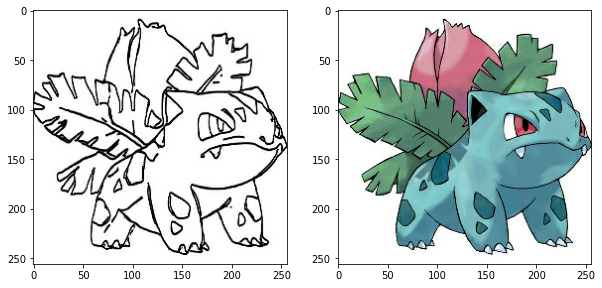

In [61]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, :w, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, w:, :] 
    colored = tf.cast(colored, tf.float32)
#     colored = img[:, :w, :] 
#     colored = tf.cast(colored, tf.float32)
#     sketch  = img[:, w:, :] 
#     sketch  = tf.cast(sketch, tf.float32)

    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]

sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

In [62]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation2(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
#     out = image.random_flip_up_down(out)
    
#     if tf.random.uniform(()) < .5:
#         degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
#         out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


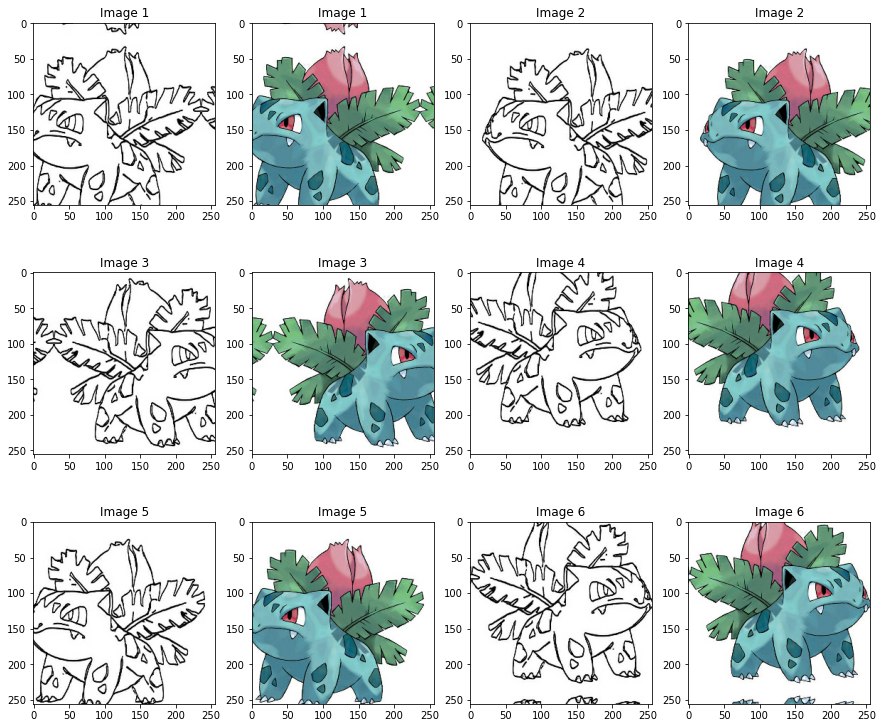

In [63]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation2(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

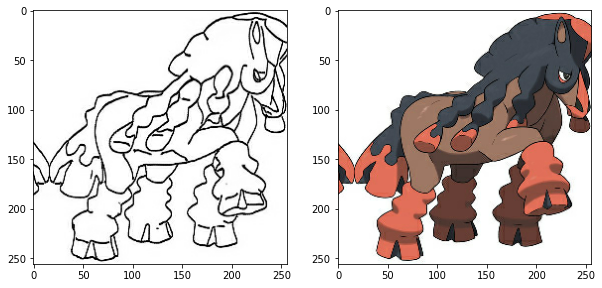

In [64]:
from tensorflow import data

def get_train2(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation2(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train2).shuffle(100).batch(8)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

## (2) Generator 구성하기

#### Generator 구현하기

In [65]:
Encoder().get_summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 encode_block (EncodeBlock)  (None, 128, 128, 64)      3072      
                                                                 
 encode_block_1 (EncodeBlock  (None, 64, 64, 128)      131584    
 )                                                               
                                                                 
 encode_block_2 (EncodeBlock  (None, 32, 32, 256)      525312    
 )                                                               
                                                                 
 encode_block_3 (EncodeBlock  (None, 16, 16, 512)      2099200   
 )                                                               
                                                             

In [66]:
Decoder().get_summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 1, 1, 512)]       0         
                                                                 
 decode_block (DecodeBlock)  (None, 2, 2, 512)         4196352   
                                                                 
 decode_block_1 (DecodeBlock  (None, 4, 4, 512)        4196352   
 )                                                               
                                                                 
 decode_block_2 (DecodeBlock  (None, 8, 8, 512)        4196352   
 )                                                               
                                                                 
 decode_block_3 (DecodeBlock  (None, 16, 16, 512)      4196352   
 )                                                               
                                                           

In [67]:
EncoderDecoderGenerator().get_summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 encoder_1 (Encoder)         (None, 1, 1, 512)         19544576  
                                                                 
 decoder_1 (Decoder)         (None, 256, 256, 3)       19542784  
                                                                 
Total params: 39,087,360
Trainable params: 39,076,480
Non-trainable params: 10,880
_________________________________________________________________


## (3) Generator 재구성하기

In [68]:
# inputs = Input((256,256,32))
# out = layers.ZeroPadding2D()(inputs)
# out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)

inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.Conv2D(128, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 128, 128, 32)]    0         
                                                                 
 zero_padding2d_3 (ZeroPaddi  (None, 130, 130, 32)     0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 127, 127, 64)      32768     
                                                                 
 conv2d_23 (Conv2D)          (None, 124, 124, 128)     131072    
                                                                 
 batch_normalization_34 (Bat  (None, 124, 124, 128)    512       
 chNormalization)                                                
                                                                 
 leaky_re_lu_21 (LeakyReLU)  (None, 124, 124, 128)     0   

In [69]:
Discriminator().get_summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_7 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_1 (Concatenate)    (None, 256, 256, 6)  0           ['input_6[0][0]',                
                                                                  'input_7[0][0]']          

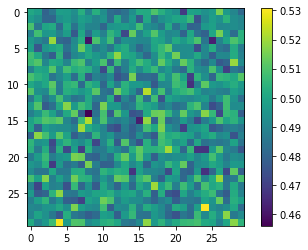

In [70]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

In [96]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(1.25e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(5e-5, beta_1=.5, beta_2=.999)

print("✅")

✅


In [74]:
generator = UNetGenerator()

In [75]:
discriminator = Discriminator()

In [97]:
EPOCHS = 300

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:1.1663                     
L1_loss:0.1390                     
Discriminator_loss:0.8137

EPOCH[1] - STEP[20]                     
Generator_loss:1.0235                     
L1_loss:0.1445                     
Discriminator_loss:0.6907

EPOCH[1] - STEP[30]                     
Generator_loss:1.9894                     
L1_loss:0.1308                     
Discriminator_loss:0.7875

EPOCH[1] - STEP[40]                     
Generator_loss:2.4492                     
L1_loss:0.1520                     
Discriminator_loss:0.8244

EPOCH[1] - STEP[50]                     
Generator_loss:1.1242                     
L1_loss:0.1414                     
Discriminator_loss:0.6458

EPOCH[1] - STEP[60]                     
Generator_loss:1.5759                     
L1_loss:0.1430                     
Discriminator_loss:0.5433

EPOCH[1] - STEP[70]                     
Generator_loss:1.5330                     
L1_loss:0.1471                    

EPOCH[6] - STEP[70]                     
Generator_loss:1.1447                     
L1_loss:0.1270                     
Discriminator_loss:1.0989

EPOCH[6] - STEP[80]                     
Generator_loss:1.7574                     
L1_loss:0.1523                     
Discriminator_loss:0.6473

EPOCH[6] - STEP[90]                     
Generator_loss:2.1911                     
L1_loss:0.1333                     
Discriminator_loss:0.8149

EPOCH[6] - STEP[100]                     
Generator_loss:0.8327                     
L1_loss:0.1314                     
Discriminator_loss:0.8172

EPOCH[7] - STEP[10]                     
Generator_loss:1.1695                     
L1_loss:0.1418                     
Discriminator_loss:0.7263

EPOCH[7] - STEP[20]                     
Generator_loss:3.2366                     
L1_loss:0.1544                     
Discriminator_loss:0.9337

EPOCH[7] - STEP[30]                     
Generator_loss:2.9309                     
L1_loss:0.1470                   

EPOCH[12] - STEP[30]                     
Generator_loss:0.9191                     
L1_loss:0.1603                     
Discriminator_loss:0.7260

EPOCH[12] - STEP[40]                     
Generator_loss:1.6682                     
L1_loss:0.1330                     
Discriminator_loss:0.6618

EPOCH[12] - STEP[50]                     
Generator_loss:2.0993                     
L1_loss:0.1337                     
Discriminator_loss:0.7434

EPOCH[12] - STEP[60]                     
Generator_loss:1.0209                     
L1_loss:0.1382                     
Discriminator_loss:0.6205

EPOCH[12] - STEP[70]                     
Generator_loss:0.7608                     
L1_loss:0.1386                     
Discriminator_loss:1.3753

EPOCH[12] - STEP[80]                     
Generator_loss:1.4013                     
L1_loss:0.1380                     
Discriminator_loss:0.4674

EPOCH[12] - STEP[90]                     
Generator_loss:1.3476                     
L1_loss:0.1293             

EPOCH[17] - STEP[90]                     
Generator_loss:2.0688                     
L1_loss:0.1381                     
Discriminator_loss:1.5506

EPOCH[17] - STEP[100]                     
Generator_loss:1.5964                     
L1_loss:0.1395                     
Discriminator_loss:1.1680

EPOCH[18] - STEP[10]                     
Generator_loss:2.2398                     
L1_loss:0.1417                     
Discriminator_loss:1.1001

EPOCH[18] - STEP[20]                     
Generator_loss:0.9053                     
L1_loss:0.1481                     
Discriminator_loss:0.6675

EPOCH[18] - STEP[30]                     
Generator_loss:3.6539                     
L1_loss:0.1336                     
Discriminator_loss:0.7114

EPOCH[18] - STEP[40]                     
Generator_loss:2.8632                     
L1_loss:0.1357                     
Discriminator_loss:0.9986

EPOCH[18] - STEP[50]                     
Generator_loss:1.0685                     
L1_loss:0.1565            

EPOCH[23] - STEP[50]                     
Generator_loss:2.1027                     
L1_loss:0.1419                     
Discriminator_loss:0.4023

EPOCH[23] - STEP[60]                     
Generator_loss:1.4580                     
L1_loss:0.1244                     
Discriminator_loss:0.4937

EPOCH[23] - STEP[70]                     
Generator_loss:1.5080                     
L1_loss:0.1239                     
Discriminator_loss:0.5692

EPOCH[23] - STEP[80]                     
Generator_loss:1.8112                     
L1_loss:0.1428                     
Discriminator_loss:0.4019

EPOCH[23] - STEP[90]                     
Generator_loss:1.9476                     
L1_loss:0.1223                     
Discriminator_loss:1.4831

EPOCH[23] - STEP[100]                     
Generator_loss:2.4157                     
L1_loss:0.1212                     
Discriminator_loss:0.9070

EPOCH[24] - STEP[10]                     
Generator_loss:1.8016                     
L1_loss:0.1446            

EPOCH[29] - STEP[10]                     
Generator_loss:1.9493                     
L1_loss:0.1489                     
Discriminator_loss:0.5831

EPOCH[29] - STEP[20]                     
Generator_loss:1.9780                     
L1_loss:0.1335                     
Discriminator_loss:0.5880

EPOCH[29] - STEP[30]                     
Generator_loss:1.2294                     
L1_loss:0.1454                     
Discriminator_loss:0.6457

EPOCH[29] - STEP[40]                     
Generator_loss:1.7918                     
L1_loss:0.1339                     
Discriminator_loss:0.4967

EPOCH[29] - STEP[50]                     
Generator_loss:1.6138                     
L1_loss:0.1251                     
Discriminator_loss:0.5346

EPOCH[29] - STEP[60]                     
Generator_loss:2.2708                     
L1_loss:0.1319                     
Discriminator_loss:0.9818

EPOCH[29] - STEP[70]                     
Generator_loss:1.9168                     
L1_loss:0.1426             

EPOCH[34] - STEP[70]                     
Generator_loss:1.5549                     
L1_loss:0.1261                     
Discriminator_loss:0.5235

EPOCH[34] - STEP[80]                     
Generator_loss:0.9568                     
L1_loss:0.1177                     
Discriminator_loss:0.7254

EPOCH[34] - STEP[90]                     
Generator_loss:2.4003                     
L1_loss:0.1345                     
Discriminator_loss:0.6051

EPOCH[34] - STEP[100]                     
Generator_loss:1.2404                     
L1_loss:0.1369                     
Discriminator_loss:0.8621

EPOCH[35] - STEP[10]                     
Generator_loss:0.5438                     
L1_loss:0.1292                     
Discriminator_loss:1.0944

EPOCH[35] - STEP[20]                     
Generator_loss:2.0199                     
L1_loss:0.1399                     
Discriminator_loss:0.5962

EPOCH[35] - STEP[30]                     
Generator_loss:2.8507                     
L1_loss:0.1214            

EPOCH[40] - STEP[30]                     
Generator_loss:2.0832                     
L1_loss:0.1360                     
Discriminator_loss:0.6756

EPOCH[40] - STEP[40]                     
Generator_loss:0.9051                     
L1_loss:0.1337                     
Discriminator_loss:0.7883

EPOCH[40] - STEP[50]                     
Generator_loss:0.9787                     
L1_loss:0.1255                     
Discriminator_loss:0.8946

EPOCH[40] - STEP[60]                     
Generator_loss:2.9237                     
L1_loss:0.1141                     
Discriminator_loss:1.6316

EPOCH[40] - STEP[70]                     
Generator_loss:2.4726                     
L1_loss:0.1556                     
Discriminator_loss:0.6771

EPOCH[40] - STEP[80]                     
Generator_loss:1.8737                     
L1_loss:0.1340                     
Discriminator_loss:0.8788

EPOCH[40] - STEP[90]                     
Generator_loss:3.0547                     
L1_loss:0.1351             

EPOCH[45] - STEP[90]                     
Generator_loss:1.8348                     
L1_loss:0.1279                     
Discriminator_loss:1.4961

EPOCH[45] - STEP[100]                     
Generator_loss:1.7966                     
L1_loss:0.1253                     
Discriminator_loss:0.3486

EPOCH[46] - STEP[10]                     
Generator_loss:2.1786                     
L1_loss:0.1300                     
Discriminator_loss:0.8337

EPOCH[46] - STEP[20]                     
Generator_loss:0.6463                     
L1_loss:0.1344                     
Discriminator_loss:0.8958

EPOCH[46] - STEP[30]                     
Generator_loss:1.7435                     
L1_loss:0.1337                     
Discriminator_loss:0.8104

EPOCH[46] - STEP[40]                     
Generator_loss:1.8449                     
L1_loss:0.1328                     
Discriminator_loss:0.5675

EPOCH[46] - STEP[50]                     
Generator_loss:2.1122                     
L1_loss:0.1294            

EPOCH[51] - STEP[50]                     
Generator_loss:1.8083                     
L1_loss:0.1316                     
Discriminator_loss:0.5132

EPOCH[51] - STEP[60]                     
Generator_loss:2.9556                     
L1_loss:0.1208                     
Discriminator_loss:1.2875

EPOCH[51] - STEP[70]                     
Generator_loss:2.8211                     
L1_loss:0.1145                     
Discriminator_loss:0.9352

EPOCH[51] - STEP[80]                     
Generator_loss:2.8765                     
L1_loss:0.1297                     
Discriminator_loss:1.0956

EPOCH[51] - STEP[90]                     
Generator_loss:0.7838                     
L1_loss:0.1251                     
Discriminator_loss:0.8959

EPOCH[51] - STEP[100]                     
Generator_loss:2.2852                     
L1_loss:0.1299                     
Discriminator_loss:1.1387

EPOCH[52] - STEP[10]                     
Generator_loss:1.3049                     
L1_loss:0.1363            

EPOCH[57] - STEP[10]                     
Generator_loss:2.1275                     
L1_loss:0.1314                     
Discriminator_loss:0.4190

EPOCH[57] - STEP[20]                     
Generator_loss:0.8614                     
L1_loss:0.1233                     
Discriminator_loss:0.8300

EPOCH[57] - STEP[30]                     
Generator_loss:1.6141                     
L1_loss:0.1181                     
Discriminator_loss:0.4288

EPOCH[57] - STEP[40]                     
Generator_loss:2.0917                     
L1_loss:0.1304                     
Discriminator_loss:0.5291

EPOCH[57] - STEP[50]                     
Generator_loss:0.9532                     
L1_loss:0.1311                     
Discriminator_loss:0.9286

EPOCH[57] - STEP[60]                     
Generator_loss:2.6300                     
L1_loss:0.1320                     
Discriminator_loss:0.7461

EPOCH[57] - STEP[70]                     
Generator_loss:0.7085                     
L1_loss:0.1262             

EPOCH[62] - STEP[70]                     
Generator_loss:1.0649                     
L1_loss:0.1414                     
Discriminator_loss:0.7543

EPOCH[62] - STEP[80]                     
Generator_loss:1.7148                     
L1_loss:0.1147                     
Discriminator_loss:0.6324

EPOCH[62] - STEP[90]                     
Generator_loss:2.6475                     
L1_loss:0.1291                     
Discriminator_loss:0.8672

EPOCH[62] - STEP[100]                     
Generator_loss:1.6796                     
L1_loss:0.1268                     
Discriminator_loss:0.3407

EPOCH[63] - STEP[10]                     
Generator_loss:0.7861                     
L1_loss:0.1334                     
Discriminator_loss:0.9371

EPOCH[63] - STEP[20]                     
Generator_loss:2.6306                     
L1_loss:0.1357                     
Discriminator_loss:1.1431

EPOCH[63] - STEP[30]                     
Generator_loss:1.1858                     
L1_loss:0.1248            

EPOCH[68] - STEP[30]                     
Generator_loss:0.6097                     
L1_loss:0.1294                     
Discriminator_loss:1.2507

EPOCH[68] - STEP[40]                     
Generator_loss:1.6486                     
L1_loss:0.1055                     
Discriminator_loss:0.5609

EPOCH[68] - STEP[50]                     
Generator_loss:1.2686                     
L1_loss:0.1211                     
Discriminator_loss:0.6930

EPOCH[68] - STEP[60]                     
Generator_loss:0.9639                     
L1_loss:0.1141                     
Discriminator_loss:0.6319

EPOCH[68] - STEP[70]                     
Generator_loss:0.8905                     
L1_loss:0.1368                     
Discriminator_loss:0.7949

EPOCH[68] - STEP[80]                     
Generator_loss:0.9537                     
L1_loss:0.1237                     
Discriminator_loss:0.7698

EPOCH[68] - STEP[90]                     
Generator_loss:2.1221                     
L1_loss:0.1238             

EPOCH[73] - STEP[90]                     
Generator_loss:3.8732                     
L1_loss:0.1193                     
Discriminator_loss:1.9761

EPOCH[73] - STEP[100]                     
Generator_loss:3.0669                     
L1_loss:0.1203                     
Discriminator_loss:1.1848

EPOCH[74] - STEP[10]                     
Generator_loss:1.0519                     
L1_loss:0.1325                     
Discriminator_loss:0.8372

EPOCH[74] - STEP[20]                     
Generator_loss:1.6312                     
L1_loss:0.1165                     
Discriminator_loss:0.5041

EPOCH[74] - STEP[30]                     
Generator_loss:2.4788                     
L1_loss:0.1137                     
Discriminator_loss:1.0325

EPOCH[74] - STEP[40]                     
Generator_loss:1.6511                     
L1_loss:0.1185                     
Discriminator_loss:0.6429

EPOCH[74] - STEP[50]                     
Generator_loss:2.7961                     
L1_loss:0.1108            

EPOCH[79] - STEP[50]                     
Generator_loss:1.4996                     
L1_loss:0.1274                     
Discriminator_loss:0.5715

EPOCH[79] - STEP[60]                     
Generator_loss:1.6888                     
L1_loss:0.1173                     
Discriminator_loss:0.4566

EPOCH[79] - STEP[70]                     
Generator_loss:2.3979                     
L1_loss:0.1188                     
Discriminator_loss:0.4950

EPOCH[79] - STEP[80]                     
Generator_loss:1.3647                     
L1_loss:0.1073                     
Discriminator_loss:0.8171

EPOCH[79] - STEP[90]                     
Generator_loss:0.8529                     
L1_loss:0.1068                     
Discriminator_loss:0.8983

EPOCH[79] - STEP[100]                     
Generator_loss:1.8272                     
L1_loss:0.1192                     
Discriminator_loss:0.4978

EPOCH[80] - STEP[10]                     
Generator_loss:0.6409                     
L1_loss:0.1420            

EPOCH[85] - STEP[10]                     
Generator_loss:0.3055                     
L1_loss:0.1104                     
Discriminator_loss:1.6463

EPOCH[85] - STEP[20]                     
Generator_loss:1.7596                     
L1_loss:0.1139                     
Discriminator_loss:0.8290

EPOCH[85] - STEP[30]                     
Generator_loss:1.8905                     
L1_loss:0.1174                     
Discriminator_loss:0.4196

EPOCH[85] - STEP[40]                     
Generator_loss:2.4988                     
L1_loss:0.1085                     
Discriminator_loss:1.2637

EPOCH[85] - STEP[50]                     
Generator_loss:1.4401                     
L1_loss:0.1253                     
Discriminator_loss:0.6886

EPOCH[85] - STEP[60]                     
Generator_loss:1.2753                     
L1_loss:0.1182                     
Discriminator_loss:0.6311

EPOCH[85] - STEP[70]                     
Generator_loss:0.4268                     
L1_loss:0.1167             

EPOCH[90] - STEP[70]                     
Generator_loss:3.4751                     
L1_loss:0.1069                     
Discriminator_loss:1.9923

EPOCH[90] - STEP[80]                     
Generator_loss:2.8835                     
L1_loss:0.1227                     
Discriminator_loss:0.8794

EPOCH[90] - STEP[90]                     
Generator_loss:0.3881                     
L1_loss:0.1221                     
Discriminator_loss:1.3808

EPOCH[90] - STEP[100]                     
Generator_loss:0.8656                     
L1_loss:0.0983                     
Discriminator_loss:0.7662

EPOCH[91] - STEP[10]                     
Generator_loss:1.2113                     
L1_loss:0.0914                     
Discriminator_loss:0.7332

EPOCH[91] - STEP[20]                     
Generator_loss:1.0183                     
L1_loss:0.1262                     
Discriminator_loss:0.9463

EPOCH[91] - STEP[30]                     
Generator_loss:1.2135                     
L1_loss:0.1301            

EPOCH[96] - STEP[30]                     
Generator_loss:0.9845                     
L1_loss:0.1188                     
Discriminator_loss:0.6440

EPOCH[96] - STEP[40]                     
Generator_loss:1.6720                     
L1_loss:0.1140                     
Discriminator_loss:0.6061

EPOCH[96] - STEP[50]                     
Generator_loss:2.0178                     
L1_loss:0.1181                     
Discriminator_loss:0.3859

EPOCH[96] - STEP[60]                     
Generator_loss:0.5065                     
L1_loss:0.1051                     
Discriminator_loss:1.3089

EPOCH[96] - STEP[70]                     
Generator_loss:1.6314                     
L1_loss:0.1103                     
Discriminator_loss:0.5745

EPOCH[96] - STEP[80]                     
Generator_loss:1.4247                     
L1_loss:0.1251                     
Discriminator_loss:0.5934

EPOCH[96] - STEP[90]                     
Generator_loss:1.1159                     
L1_loss:0.1054             

EPOCH[101] - STEP[90]                     
Generator_loss:1.8388                     
L1_loss:0.1193                     
Discriminator_loss:0.8607

EPOCH[101] - STEP[100]                     
Generator_loss:1.4245                     
L1_loss:0.1296                     
Discriminator_loss:0.5927

EPOCH[102] - STEP[10]                     
Generator_loss:1.6250                     
L1_loss:0.1172                     
Discriminator_loss:0.7972

EPOCH[102] - STEP[20]                     
Generator_loss:0.5286                     
L1_loss:0.1196                     
Discriminator_loss:1.1098

EPOCH[102] - STEP[30]                     
Generator_loss:2.5348                     
L1_loss:0.1259                     
Discriminator_loss:0.5199

EPOCH[102] - STEP[40]                     
Generator_loss:0.4655                     
L1_loss:0.1262                     
Discriminator_loss:1.2740

EPOCH[102] - STEP[50]                     
Generator_loss:1.8972                     
L1_loss:0.1166     

EPOCH[107] - STEP[40]                     
Generator_loss:2.3742                     
L1_loss:0.1156                     
Discriminator_loss:0.4782

EPOCH[107] - STEP[50]                     
Generator_loss:3.1417                     
L1_loss:0.1223                     
Discriminator_loss:0.6780

EPOCH[107] - STEP[60]                     
Generator_loss:0.4495                     
L1_loss:0.1228                     
Discriminator_loss:1.2165

EPOCH[107] - STEP[70]                     
Generator_loss:0.6472                     
L1_loss:0.1002                     
Discriminator_loss:1.0739

EPOCH[107] - STEP[80]                     
Generator_loss:1.2878                     
L1_loss:0.1105                     
Discriminator_loss:1.1572

EPOCH[107] - STEP[90]                     
Generator_loss:1.3646                     
L1_loss:0.1255                     
Discriminator_loss:1.0203

EPOCH[107] - STEP[100]                     
Generator_loss:2.2355                     
L1_loss:0.1112     

EPOCH[112] - STEP[90]                     
Generator_loss:1.6671                     
L1_loss:0.1125                     
Discriminator_loss:0.3583

EPOCH[112] - STEP[100]                     
Generator_loss:0.9979                     
L1_loss:0.1054                     
Discriminator_loss:0.6460

EPOCH[113] - STEP[10]                     
Generator_loss:1.5712                     
L1_loss:0.1089                     
Discriminator_loss:0.7923

EPOCH[113] - STEP[20]                     
Generator_loss:0.9566                     
L1_loss:0.1196                     
Discriminator_loss:0.7660

EPOCH[113] - STEP[30]                     
Generator_loss:0.3048                     
L1_loss:0.1067                     
Discriminator_loss:1.5580

EPOCH[113] - STEP[40]                     
Generator_loss:2.6014                     
L1_loss:0.0922                     
Discriminator_loss:1.0605

EPOCH[113] - STEP[50]                     
Generator_loss:3.2316                     
L1_loss:0.1370     

EPOCH[118] - STEP[40]                     
Generator_loss:1.7671                     
L1_loss:0.0961                     
Discriminator_loss:0.7689

EPOCH[118] - STEP[50]                     
Generator_loss:3.1397                     
L1_loss:0.1077                     
Discriminator_loss:0.7396

EPOCH[118] - STEP[60]                     
Generator_loss:2.5658                     
L1_loss:0.1244                     
Discriminator_loss:2.1130

EPOCH[118] - STEP[70]                     
Generator_loss:2.1600                     
L1_loss:0.0995                     
Discriminator_loss:1.2703

EPOCH[118] - STEP[80]                     
Generator_loss:0.3100                     
L1_loss:0.1145                     
Discriminator_loss:1.6810

EPOCH[118] - STEP[90]                     
Generator_loss:1.5217                     
L1_loss:0.1134                     
Discriminator_loss:0.5901

EPOCH[118] - STEP[100]                     
Generator_loss:0.9993                     
L1_loss:0.1180     

EPOCH[123] - STEP[90]                     
Generator_loss:2.2128                     
L1_loss:0.1167                     
Discriminator_loss:0.2960

EPOCH[123] - STEP[100]                     
Generator_loss:2.0700                     
L1_loss:0.1103                     
Discriminator_loss:0.5723

EPOCH[124] - STEP[10]                     
Generator_loss:0.8355                     
L1_loss:0.1251                     
Discriminator_loss:0.9127

EPOCH[124] - STEP[20]                     
Generator_loss:3.4845                     
L1_loss:0.1146                     
Discriminator_loss:0.7945

EPOCH[124] - STEP[30]                     
Generator_loss:2.3912                     
L1_loss:0.1069                     
Discriminator_loss:0.6721

EPOCH[124] - STEP[40]                     
Generator_loss:1.3208                     
L1_loss:0.1025                     
Discriminator_loss:0.5330

EPOCH[124] - STEP[50]                     
Generator_loss:1.0448                     
L1_loss:0.1033     

EPOCH[129] - STEP[40]                     
Generator_loss:2.9768                     
L1_loss:0.1091                     
Discriminator_loss:0.7556

EPOCH[129] - STEP[50]                     
Generator_loss:0.4598                     
L1_loss:0.1409                     
Discriminator_loss:1.4238

EPOCH[129] - STEP[60]                     
Generator_loss:2.1007                     
L1_loss:0.1214                     
Discriminator_loss:0.4354

EPOCH[129] - STEP[70]                     
Generator_loss:0.4147                     
L1_loss:0.1153                     
Discriminator_loss:1.4004

EPOCH[129] - STEP[80]                     
Generator_loss:4.1791                     
L1_loss:0.0958                     
Discriminator_loss:1.8072

EPOCH[129] - STEP[90]                     
Generator_loss:0.5549                     
L1_loss:0.1011                     
Discriminator_loss:1.1654

EPOCH[129] - STEP[100]                     
Generator_loss:1.7591                     
L1_loss:0.1322     

EPOCH[134] - STEP[90]                     
Generator_loss:1.1456                     
L1_loss:0.1002                     
Discriminator_loss:0.5483

EPOCH[134] - STEP[100]                     
Generator_loss:3.2114                     
L1_loss:0.1183                     
Discriminator_loss:0.4294

EPOCH[135] - STEP[10]                     
Generator_loss:2.4760                     
L1_loss:0.1105                     
Discriminator_loss:0.5110

EPOCH[135] - STEP[20]                     
Generator_loss:2.0516                     
L1_loss:0.1170                     
Discriminator_loss:0.5929

EPOCH[135] - STEP[30]                     
Generator_loss:0.2535                     
L1_loss:0.1036                     
Discriminator_loss:1.7765

EPOCH[135] - STEP[40]                     
Generator_loss:2.7001                     
L1_loss:0.1366                     
Discriminator_loss:0.3964

EPOCH[135] - STEP[50]                     
Generator_loss:1.4342                     
L1_loss:0.1120     

EPOCH[140] - STEP[40]                     
Generator_loss:0.7226                     
L1_loss:0.1253                     
Discriminator_loss:0.8761

EPOCH[140] - STEP[50]                     
Generator_loss:1.5071                     
L1_loss:0.1191                     
Discriminator_loss:0.6377

EPOCH[140] - STEP[60]                     
Generator_loss:2.1095                     
L1_loss:0.1087                     
Discriminator_loss:0.5833

EPOCH[140] - STEP[70]                     
Generator_loss:1.4756                     
L1_loss:0.1178                     
Discriminator_loss:0.5596

EPOCH[140] - STEP[80]                     
Generator_loss:0.9499                     
L1_loss:0.1090                     
Discriminator_loss:0.7487

EPOCH[140] - STEP[90]                     
Generator_loss:0.4742                     
L1_loss:0.1181                     
Discriminator_loss:1.1990

EPOCH[140] - STEP[100]                     
Generator_loss:1.7898                     
L1_loss:0.1177     

EPOCH[145] - STEP[90]                     
Generator_loss:2.0763                     
L1_loss:0.1151                     
Discriminator_loss:0.9629

EPOCH[145] - STEP[100]                     
Generator_loss:2.3380                     
L1_loss:0.1192                     
Discriminator_loss:0.3446

EPOCH[146] - STEP[10]                     
Generator_loss:0.6351                     
L1_loss:0.1134                     
Discriminator_loss:0.9999

EPOCH[146] - STEP[20]                     
Generator_loss:0.9143                     
L1_loss:0.0994                     
Discriminator_loss:0.8179

EPOCH[146] - STEP[30]                     
Generator_loss:1.7762                     
L1_loss:0.1071                     
Discriminator_loss:0.6609

EPOCH[146] - STEP[40]                     
Generator_loss:2.2863                     
L1_loss:0.1252                     
Discriminator_loss:0.3421

EPOCH[146] - STEP[50]                     
Generator_loss:3.6242                     
L1_loss:0.1166     

EPOCH[151] - STEP[40]                     
Generator_loss:1.8129                     
L1_loss:0.1274                     
Discriminator_loss:0.5297

EPOCH[151] - STEP[50]                     
Generator_loss:0.2912                     
L1_loss:0.1265                     
Discriminator_loss:1.6089

EPOCH[151] - STEP[60]                     
Generator_loss:1.7131                     
L1_loss:0.1214                     
Discriminator_loss:0.3808

EPOCH[151] - STEP[70]                     
Generator_loss:3.9590                     
L1_loss:0.1036                     
Discriminator_loss:1.5148

EPOCH[151] - STEP[80]                     
Generator_loss:2.6464                     
L1_loss:0.1180                     
Discriminator_loss:0.6802

EPOCH[151] - STEP[90]                     
Generator_loss:0.6799                     
L1_loss:0.1117                     
Discriminator_loss:0.8711

EPOCH[151] - STEP[100]                     
Generator_loss:3.8683                     
L1_loss:0.1017     

EPOCH[156] - STEP[90]                     
Generator_loss:2.8192                     
L1_loss:0.1154                     
Discriminator_loss:0.5060

EPOCH[156] - STEP[100]                     
Generator_loss:1.7199                     
L1_loss:0.1139                     
Discriminator_loss:0.4827

EPOCH[157] - STEP[10]                     
Generator_loss:1.8455                     
L1_loss:0.0999                     
Discriminator_loss:0.6368

EPOCH[157] - STEP[20]                     
Generator_loss:0.8570                     
L1_loss:0.1125                     
Discriminator_loss:0.7420

EPOCH[157] - STEP[30]                     
Generator_loss:2.1881                     
L1_loss:0.1300                     
Discriminator_loss:0.6638

EPOCH[157] - STEP[40]                     
Generator_loss:1.1742                     
L1_loss:0.0986                     
Discriminator_loss:0.5640

EPOCH[157] - STEP[50]                     
Generator_loss:1.5747                     
L1_loss:0.1125     

EPOCH[162] - STEP[40]                     
Generator_loss:3.1619                     
L1_loss:0.1084                     
Discriminator_loss:0.7540

EPOCH[162] - STEP[50]                     
Generator_loss:2.9683                     
L1_loss:0.1165                     
Discriminator_loss:0.5955

EPOCH[162] - STEP[60]                     
Generator_loss:2.6086                     
L1_loss:0.1133                     
Discriminator_loss:1.1763

EPOCH[162] - STEP[70]                     
Generator_loss:0.7933                     
L1_loss:0.0885                     
Discriminator_loss:0.8306

EPOCH[162] - STEP[80]                     
Generator_loss:2.0692                     
L1_loss:0.1070                     
Discriminator_loss:0.9701

EPOCH[162] - STEP[90]                     
Generator_loss:1.1500                     
L1_loss:0.1028                     
Discriminator_loss:0.5800

EPOCH[162] - STEP[100]                     
Generator_loss:4.9456                     
L1_loss:0.1092     

EPOCH[167] - STEP[90]                     
Generator_loss:0.9848                     
L1_loss:0.1032                     
Discriminator_loss:0.7294

EPOCH[167] - STEP[100]                     
Generator_loss:1.7695                     
L1_loss:0.1134                     
Discriminator_loss:0.8287

EPOCH[168] - STEP[10]                     
Generator_loss:3.3976                     
L1_loss:0.1117                     
Discriminator_loss:0.5313

EPOCH[168] - STEP[20]                     
Generator_loss:1.3630                     
L1_loss:0.1059                     
Discriminator_loss:0.5643

EPOCH[168] - STEP[30]                     
Generator_loss:1.7958                     
L1_loss:0.1054                     
Discriminator_loss:0.4977

EPOCH[168] - STEP[40]                     
Generator_loss:1.7026                     
L1_loss:0.1203                     
Discriminator_loss:0.3983

EPOCH[168] - STEP[50]                     
Generator_loss:0.4669                     
L1_loss:0.1232     

EPOCH[173] - STEP[40]                     
Generator_loss:2.2775                     
L1_loss:0.1104                     
Discriminator_loss:0.3432

EPOCH[173] - STEP[50]                     
Generator_loss:0.4768                     
L1_loss:0.1132                     
Discriminator_loss:1.2155

EPOCH[173] - STEP[60]                     
Generator_loss:2.5610                     
L1_loss:0.1056                     
Discriminator_loss:0.7964

EPOCH[173] - STEP[70]                     
Generator_loss:2.1218                     
L1_loss:0.1053                     
Discriminator_loss:0.3231

EPOCH[173] - STEP[80]                     
Generator_loss:1.4092                     
L1_loss:0.1089                     
Discriminator_loss:0.4831

EPOCH[173] - STEP[90]                     
Generator_loss:1.6248                     
L1_loss:0.1190                     
Discriminator_loss:0.9182

EPOCH[173] - STEP[100]                     
Generator_loss:1.5956                     
L1_loss:0.1099     

EPOCH[178] - STEP[90]                     
Generator_loss:2.6676                     
L1_loss:0.1037                     
Discriminator_loss:0.6895

EPOCH[178] - STEP[100]                     
Generator_loss:0.6599                     
L1_loss:0.1067                     
Discriminator_loss:0.8668

EPOCH[179] - STEP[10]                     
Generator_loss:1.6201                     
L1_loss:0.1121                     
Discriminator_loss:0.4069

EPOCH[179] - STEP[20]                     
Generator_loss:2.7715                     
L1_loss:0.1058                     
Discriminator_loss:0.4816

EPOCH[179] - STEP[30]                     
Generator_loss:3.4152                     
L1_loss:0.1189                     
Discriminator_loss:0.7402

EPOCH[179] - STEP[40]                     
Generator_loss:1.7745                     
L1_loss:0.0953                     
Discriminator_loss:0.5060

EPOCH[179] - STEP[50]                     
Generator_loss:0.6307                     
L1_loss:0.1044     

EPOCH[184] - STEP[40]                     
Generator_loss:0.6179                     
L1_loss:0.1156                     
Discriminator_loss:1.0816

EPOCH[184] - STEP[50]                     
Generator_loss:0.6235                     
L1_loss:0.1139                     
Discriminator_loss:1.0111

EPOCH[184] - STEP[60]                     
Generator_loss:0.8107                     
L1_loss:0.1130                     
Discriminator_loss:0.9499

EPOCH[184] - STEP[70]                     
Generator_loss:1.6145                     
L1_loss:0.1118                     
Discriminator_loss:0.6393

EPOCH[184] - STEP[80]                     
Generator_loss:3.3889                     
L1_loss:0.1193                     
Discriminator_loss:0.5438

EPOCH[184] - STEP[90]                     
Generator_loss:1.2909                     
L1_loss:0.0995                     
Discriminator_loss:0.4786

EPOCH[184] - STEP[100]                     
Generator_loss:0.9784                     
L1_loss:0.1108     

EPOCH[189] - STEP[90]                     
Generator_loss:2.8438                     
L1_loss:0.1156                     
Discriminator_loss:0.3069

EPOCH[189] - STEP[100]                     
Generator_loss:2.3740                     
L1_loss:0.0961                     
Discriminator_loss:0.7839

EPOCH[190] - STEP[10]                     
Generator_loss:2.6924                     
L1_loss:0.1062                     
Discriminator_loss:0.8196

EPOCH[190] - STEP[20]                     
Generator_loss:1.3408                     
L1_loss:0.1154                     
Discriminator_loss:0.4533

EPOCH[190] - STEP[30]                     
Generator_loss:3.2568                     
L1_loss:0.1213                     
Discriminator_loss:0.3461

EPOCH[190] - STEP[40]                     
Generator_loss:0.6576                     
L1_loss:0.1118                     
Discriminator_loss:1.1540

EPOCH[190] - STEP[50]                     
Generator_loss:1.1430                     
L1_loss:0.1105     

EPOCH[195] - STEP[40]                     
Generator_loss:1.8356                     
L1_loss:0.1169                     
Discriminator_loss:0.5406

EPOCH[195] - STEP[50]                     
Generator_loss:2.8337                     
L1_loss:0.1100                     
Discriminator_loss:0.3080

EPOCH[195] - STEP[60]                     
Generator_loss:0.8586                     
L1_loss:0.1081                     
Discriminator_loss:1.0620

EPOCH[195] - STEP[70]                     
Generator_loss:1.2992                     
L1_loss:0.1026                     
Discriminator_loss:0.6328

EPOCH[195] - STEP[80]                     
Generator_loss:2.2508                     
L1_loss:0.0956                     
Discriminator_loss:0.4961

EPOCH[195] - STEP[90]                     
Generator_loss:1.1335                     
L1_loss:0.1094                     
Discriminator_loss:0.7062

EPOCH[195] - STEP[100]                     
Generator_loss:1.1582                     
L1_loss:0.1076     

EPOCH[200] - STEP[90]                     
Generator_loss:2.3399                     
L1_loss:0.1119                     
Discriminator_loss:1.2933

EPOCH[200] - STEP[100]                     
Generator_loss:1.0885                     
L1_loss:0.0982                     
Discriminator_loss:0.7240

EPOCH[201] - STEP[10]                     
Generator_loss:1.2675                     
L1_loss:0.1000                     
Discriminator_loss:0.7570

EPOCH[201] - STEP[20]                     
Generator_loss:1.0238                     
L1_loss:0.1087                     
Discriminator_loss:0.5922

EPOCH[201] - STEP[30]                     
Generator_loss:1.1255                     
L1_loss:0.0945                     
Discriminator_loss:0.7044

EPOCH[201] - STEP[40]                     
Generator_loss:0.6314                     
L1_loss:0.0983                     
Discriminator_loss:1.2130

EPOCH[201] - STEP[50]                     
Generator_loss:1.9724                     
L1_loss:0.1219     

EPOCH[206] - STEP[40]                     
Generator_loss:3.4616                     
L1_loss:0.1058                     
Discriminator_loss:1.1819

EPOCH[206] - STEP[50]                     
Generator_loss:0.3362                     
L1_loss:0.1286                     
Discriminator_loss:1.8721

EPOCH[206] - STEP[60]                     
Generator_loss:0.9540                     
L1_loss:0.1188                     
Discriminator_loss:0.6282

EPOCH[206] - STEP[70]                     
Generator_loss:1.0733                     
L1_loss:0.1171                     
Discriminator_loss:0.7894

EPOCH[206] - STEP[80]                     
Generator_loss:2.9309                     
L1_loss:0.0936                     
Discriminator_loss:0.6372

EPOCH[206] - STEP[90]                     
Generator_loss:2.4764                     
L1_loss:0.1002                     
Discriminator_loss:1.0071

EPOCH[206] - STEP[100]                     
Generator_loss:0.5952                     
L1_loss:0.1207     

EPOCH[211] - STEP[90]                     
Generator_loss:0.7125                     
L1_loss:0.1155                     
Discriminator_loss:0.9079

EPOCH[211] - STEP[100]                     
Generator_loss:3.2957                     
L1_loss:0.1079                     
Discriminator_loss:0.9704

EPOCH[212] - STEP[10]                     
Generator_loss:2.2632                     
L1_loss:0.1024                     
Discriminator_loss:0.6529

EPOCH[212] - STEP[20]                     
Generator_loss:1.3218                     
L1_loss:0.1177                     
Discriminator_loss:0.5169

EPOCH[212] - STEP[30]                     
Generator_loss:2.5607                     
L1_loss:0.1140                     
Discriminator_loss:0.2665

EPOCH[212] - STEP[40]                     
Generator_loss:1.6026                     
L1_loss:0.1008                     
Discriminator_loss:0.4989

EPOCH[212] - STEP[50]                     
Generator_loss:1.4003                     
L1_loss:0.1051     

EPOCH[217] - STEP[40]                     
Generator_loss:1.2792                     
L1_loss:0.0920                     
Discriminator_loss:0.6084

EPOCH[217] - STEP[50]                     
Generator_loss:3.0924                     
L1_loss:0.1147                     
Discriminator_loss:0.4688

EPOCH[217] - STEP[60]                     
Generator_loss:1.3683                     
L1_loss:0.1094                     
Discriminator_loss:0.5726

EPOCH[217] - STEP[70]                     
Generator_loss:2.6558                     
L1_loss:0.1136                     
Discriminator_loss:0.2867

EPOCH[217] - STEP[80]                     
Generator_loss:0.4399                     
L1_loss:0.1272                     
Discriminator_loss:1.3684

EPOCH[217] - STEP[90]                     
Generator_loss:2.1222                     
L1_loss:0.1007                     
Discriminator_loss:0.4339

EPOCH[217] - STEP[100]                     
Generator_loss:2.5098                     
L1_loss:0.1009     

EPOCH[222] - STEP[90]                     
Generator_loss:2.7180                     
L1_loss:0.0935                     
Discriminator_loss:0.9746

EPOCH[222] - STEP[100]                     
Generator_loss:0.6679                     
L1_loss:0.1056                     
Discriminator_loss:0.9379

EPOCH[223] - STEP[10]                     
Generator_loss:4.1172                     
L1_loss:0.1019                     
Discriminator_loss:0.8916

EPOCH[223] - STEP[20]                     
Generator_loss:3.2287                     
L1_loss:0.0999                     
Discriminator_loss:0.8475

EPOCH[223] - STEP[30]                     
Generator_loss:2.5082                     
L1_loss:0.1085                     
Discriminator_loss:0.5997

EPOCH[223] - STEP[40]                     
Generator_loss:2.5360                     
L1_loss:0.1031                     
Discriminator_loss:0.5423

EPOCH[223] - STEP[50]                     
Generator_loss:2.1677                     
L1_loss:0.1139     

EPOCH[228] - STEP[40]                     
Generator_loss:2.1437                     
L1_loss:0.1009                     
Discriminator_loss:0.3814

EPOCH[228] - STEP[50]                     
Generator_loss:0.9758                     
L1_loss:0.1041                     
Discriminator_loss:0.7142

EPOCH[228] - STEP[60]                     
Generator_loss:3.0365                     
L1_loss:0.1200                     
Discriminator_loss:0.3568

EPOCH[228] - STEP[70]                     
Generator_loss:1.4089                     
L1_loss:0.1154                     
Discriminator_loss:0.3899

EPOCH[228] - STEP[80]                     
Generator_loss:0.2782                     
L1_loss:0.1023                     
Discriminator_loss:1.9281

EPOCH[228] - STEP[90]                     
Generator_loss:1.1966                     
L1_loss:0.1108                     
Discriminator_loss:0.7012

EPOCH[228] - STEP[100]                     
Generator_loss:2.2379                     
L1_loss:0.1070     

EPOCH[233] - STEP[90]                     
Generator_loss:1.9066                     
L1_loss:0.1023                     
Discriminator_loss:0.8289

EPOCH[233] - STEP[100]                     
Generator_loss:1.8567                     
L1_loss:0.0871                     
Discriminator_loss:1.1169

EPOCH[234] - STEP[10]                     
Generator_loss:1.2406                     
L1_loss:0.1134                     
Discriminator_loss:0.5975

EPOCH[234] - STEP[20]                     
Generator_loss:2.6602                     
L1_loss:0.1024                     
Discriminator_loss:0.2923

EPOCH[234] - STEP[30]                     
Generator_loss:2.2097                     
L1_loss:0.0964                     
Discriminator_loss:0.3637

EPOCH[234] - STEP[40]                     
Generator_loss:0.8223                     
L1_loss:0.1024                     
Discriminator_loss:0.8351

EPOCH[234] - STEP[50]                     
Generator_loss:1.6611                     
L1_loss:0.1142     

EPOCH[239] - STEP[40]                     
Generator_loss:2.4791                     
L1_loss:0.0996                     
Discriminator_loss:0.6295

EPOCH[239] - STEP[50]                     
Generator_loss:1.2870                     
L1_loss:0.1234                     
Discriminator_loss:0.5596

EPOCH[239] - STEP[60]                     
Generator_loss:0.8772                     
L1_loss:0.1110                     
Discriminator_loss:0.7339

EPOCH[239] - STEP[70]                     
Generator_loss:2.5900                     
L1_loss:0.1052                     
Discriminator_loss:0.2120

EPOCH[239] - STEP[80]                     
Generator_loss:3.1755                     
L1_loss:0.1312                     
Discriminator_loss:0.2928

EPOCH[239] - STEP[90]                     
Generator_loss:2.0639                     
L1_loss:0.1117                     
Discriminator_loss:0.6247

EPOCH[239] - STEP[100]                     
Generator_loss:2.6038                     
L1_loss:0.0950     

EPOCH[244] - STEP[90]                     
Generator_loss:0.3459                     
L1_loss:0.0983                     
Discriminator_loss:1.4901

EPOCH[244] - STEP[100]                     
Generator_loss:0.5418                     
L1_loss:0.1066                     
Discriminator_loss:1.1329

EPOCH[245] - STEP[10]                     
Generator_loss:1.0442                     
L1_loss:0.1135                     
Discriminator_loss:0.9312

EPOCH[245] - STEP[20]                     
Generator_loss:2.0255                     
L1_loss:0.1158                     
Discriminator_loss:0.4992

EPOCH[245] - STEP[30]                     
Generator_loss:1.3426                     
L1_loss:0.1082                     
Discriminator_loss:0.4860

EPOCH[245] - STEP[40]                     
Generator_loss:1.0736                     
L1_loss:0.0937                     
Discriminator_loss:0.5965

EPOCH[245] - STEP[50]                     
Generator_loss:1.1770                     
L1_loss:0.0906     

EPOCH[250] - STEP[40]                     
Generator_loss:1.6758                     
L1_loss:0.1094                     
Discriminator_loss:0.5488

EPOCH[250] - STEP[50]                     
Generator_loss:0.8287                     
L1_loss:0.0945                     
Discriminator_loss:0.8957

EPOCH[250] - STEP[60]                     
Generator_loss:1.3946                     
L1_loss:0.0925                     
Discriminator_loss:0.4194

EPOCH[250] - STEP[70]                     
Generator_loss:0.5783                     
L1_loss:0.0958                     
Discriminator_loss:1.2237

EPOCH[250] - STEP[80]                     
Generator_loss:2.6573                     
L1_loss:0.1068                     
Discriminator_loss:0.2017

EPOCH[250] - STEP[90]                     
Generator_loss:2.7135                     
L1_loss:0.1191                     
Discriminator_loss:0.3101

EPOCH[250] - STEP[100]                     
Generator_loss:3.2823                     
L1_loss:0.1011     

EPOCH[255] - STEP[90]                     
Generator_loss:2.7297                     
L1_loss:0.1056                     
Discriminator_loss:0.1811

EPOCH[255] - STEP[100]                     
Generator_loss:2.0985                     
L1_loss:0.0993                     
Discriminator_loss:0.3421

EPOCH[256] - STEP[10]                     
Generator_loss:3.9019                     
L1_loss:0.1089                     
Discriminator_loss:0.7098

EPOCH[256] - STEP[20]                     
Generator_loss:1.6628                     
L1_loss:0.1011                     
Discriminator_loss:0.3482

EPOCH[256] - STEP[30]                     
Generator_loss:2.2622                     
L1_loss:0.1071                     
Discriminator_loss:0.2348

EPOCH[256] - STEP[40]                     
Generator_loss:3.7879                     
L1_loss:0.1018                     
Discriminator_loss:0.3904

EPOCH[256] - STEP[50]                     
Generator_loss:2.0602                     
L1_loss:0.1036     

EPOCH[261] - STEP[40]                     
Generator_loss:2.9053                     
L1_loss:0.1090                     
Discriminator_loss:0.4265

EPOCH[261] - STEP[50]                     
Generator_loss:0.9909                     
L1_loss:0.1013                     
Discriminator_loss:0.6948

EPOCH[261] - STEP[60]                     
Generator_loss:2.4391                     
L1_loss:0.1003                     
Discriminator_loss:0.3022

EPOCH[261] - STEP[70]                     
Generator_loss:2.2582                     
L1_loss:0.1060                     
Discriminator_loss:0.6207

EPOCH[261] - STEP[80]                     
Generator_loss:1.6819                     
L1_loss:0.0966                     
Discriminator_loss:0.5455

EPOCH[261] - STEP[90]                     
Generator_loss:1.1932                     
L1_loss:0.1051                     
Discriminator_loss:0.5027

EPOCH[261] - STEP[100]                     
Generator_loss:1.9650                     
L1_loss:0.1076     

EPOCH[266] - STEP[90]                     
Generator_loss:1.0918                     
L1_loss:0.1022                     
Discriminator_loss:1.1523

EPOCH[266] - STEP[100]                     
Generator_loss:3.7744                     
L1_loss:0.1063                     
Discriminator_loss:0.6272

EPOCH[267] - STEP[10]                     
Generator_loss:2.8562                     
L1_loss:0.1003                     
Discriminator_loss:0.6038

EPOCH[267] - STEP[20]                     
Generator_loss:3.1524                     
L1_loss:0.0959                     
Discriminator_loss:0.5823

EPOCH[267] - STEP[30]                     
Generator_loss:1.0524                     
L1_loss:0.0945                     
Discriminator_loss:0.5778

EPOCH[267] - STEP[40]                     
Generator_loss:2.8575                     
L1_loss:0.1042                     
Discriminator_loss:1.1136

EPOCH[267] - STEP[50]                     
Generator_loss:0.8738                     
L1_loss:0.1167     

EPOCH[272] - STEP[40]                     
Generator_loss:2.2081                     
L1_loss:0.1126                     
Discriminator_loss:0.4147

EPOCH[272] - STEP[50]                     
Generator_loss:1.7096                     
L1_loss:0.1062                     
Discriminator_loss:0.3679

EPOCH[272] - STEP[60]                     
Generator_loss:3.3939                     
L1_loss:0.0977                     
Discriminator_loss:0.3830

EPOCH[272] - STEP[70]                     
Generator_loss:2.7379                     
L1_loss:0.0973                     
Discriminator_loss:0.3048

EPOCH[272] - STEP[80]                     
Generator_loss:2.8241                     
L1_loss:0.1120                     
Discriminator_loss:0.6026

EPOCH[272] - STEP[90]                     
Generator_loss:1.2649                     
L1_loss:0.0982                     
Discriminator_loss:0.5268

EPOCH[272] - STEP[100]                     
Generator_loss:1.9742                     
L1_loss:0.1117     

EPOCH[277] - STEP[90]                     
Generator_loss:0.9290                     
L1_loss:0.1082                     
Discriminator_loss:0.6456

EPOCH[277] - STEP[100]                     
Generator_loss:2.1128                     
L1_loss:0.0908                     
Discriminator_loss:0.7133

EPOCH[278] - STEP[10]                     
Generator_loss:1.1320                     
L1_loss:0.0967                     
Discriminator_loss:0.6467

EPOCH[278] - STEP[20]                     
Generator_loss:1.8501                     
L1_loss:0.1179                     
Discriminator_loss:0.3443

EPOCH[278] - STEP[30]                     
Generator_loss:1.5115                     
L1_loss:0.1063                     
Discriminator_loss:0.3967

EPOCH[278] - STEP[40]                     
Generator_loss:3.2744                     
L1_loss:0.1025                     
Discriminator_loss:0.4492

EPOCH[278] - STEP[50]                     
Generator_loss:5.3157                     
L1_loss:0.1104     

EPOCH[283] - STEP[40]                     
Generator_loss:1.6972                     
L1_loss:0.1114                     
Discriminator_loss:0.6208

EPOCH[283] - STEP[50]                     
Generator_loss:2.2209                     
L1_loss:0.1067                     
Discriminator_loss:0.2872

EPOCH[283] - STEP[60]                     
Generator_loss:2.4664                     
L1_loss:0.1141                     
Discriminator_loss:0.3498

EPOCH[283] - STEP[70]                     
Generator_loss:2.3441                     
L1_loss:0.0959                     
Discriminator_loss:0.3492

EPOCH[283] - STEP[80]                     
Generator_loss:1.7745                     
L1_loss:0.0944                     
Discriminator_loss:0.3564

EPOCH[283] - STEP[90]                     
Generator_loss:3.3875                     
L1_loss:0.1038                     
Discriminator_loss:0.4850

EPOCH[283] - STEP[100]                     
Generator_loss:3.8142                     
L1_loss:0.0962     

EPOCH[288] - STEP[90]                     
Generator_loss:4.0932                     
L1_loss:0.1013                     
Discriminator_loss:0.8543

EPOCH[288] - STEP[100]                     
Generator_loss:1.5225                     
L1_loss:0.1116                     
Discriminator_loss:0.4248

EPOCH[289] - STEP[10]                     
Generator_loss:2.3256                     
L1_loss:0.1064                     
Discriminator_loss:0.3038

EPOCH[289] - STEP[20]                     
Generator_loss:1.0425                     
L1_loss:0.1049                     
Discriminator_loss:0.6638

EPOCH[289] - STEP[30]                     
Generator_loss:1.4920                     
L1_loss:0.1105                     
Discriminator_loss:0.3788

EPOCH[289] - STEP[40]                     
Generator_loss:1.9657                     
L1_loss:0.1034                     
Discriminator_loss:0.3290

EPOCH[289] - STEP[50]                     
Generator_loss:0.7701                     
L1_loss:0.1112     

EPOCH[294] - STEP[40]                     
Generator_loss:1.3628                     
L1_loss:0.1126                     
Discriminator_loss:0.5735

EPOCH[294] - STEP[50]                     
Generator_loss:1.6657                     
L1_loss:0.1047                     
Discriminator_loss:0.3208

EPOCH[294] - STEP[60]                     
Generator_loss:1.4288                     
L1_loss:0.1022                     
Discriminator_loss:0.4364

EPOCH[294] - STEP[70]                     
Generator_loss:0.8419                     
L1_loss:0.1071                     
Discriminator_loss:0.7616

EPOCH[294] - STEP[80]                     
Generator_loss:2.7062                     
L1_loss:0.0941                     
Discriminator_loss:0.2493

EPOCH[294] - STEP[90]                     
Generator_loss:0.5061                     
L1_loss:0.0845                     
Discriminator_loss:1.4497

EPOCH[294] - STEP[100]                     
Generator_loss:2.4542                     
L1_loss:0.0943     

EPOCH[299] - STEP[90]                     
Generator_loss:2.5816                     
L1_loss:0.0950                     
Discriminator_loss:0.2784

EPOCH[299] - STEP[100]                     
Generator_loss:2.8060                     
L1_loss:0.0935                     
Discriminator_loss:0.2220

EPOCH[300] - STEP[10]                     
Generator_loss:2.3353                     
L1_loss:0.1028                     
Discriminator_loss:0.6244

EPOCH[300] - STEP[20]                     
Generator_loss:2.3107                     
L1_loss:0.1106                     
Discriminator_loss:0.2857

EPOCH[300] - STEP[30]                     
Generator_loss:5.0761                     
L1_loss:0.0872                     
Discriminator_loss:0.8434

EPOCH[300] - STEP[40]                     
Generator_loss:4.2679                     
L1_loss:0.1064                     
Discriminator_loss:0.4337

EPOCH[300] - STEP[50]                     
Generator_loss:3.2301                     
L1_loss:0.1029     

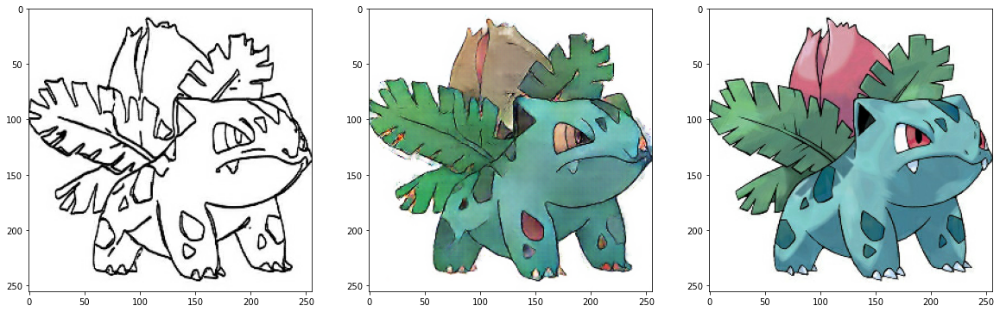

In [98]:
test_ind = 1

# test_path = Path.joinpath(Path.cwd(),''cityscapes','val')
# test_path = 'cityscapes\\val\\'
test_path = 'data\\pokemon_pix2pix_dataset\\test\\'

f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

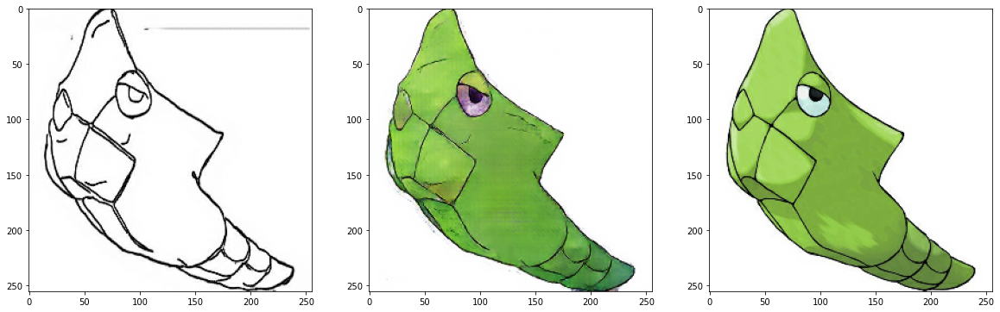

In [99]:
test_ind = 2
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

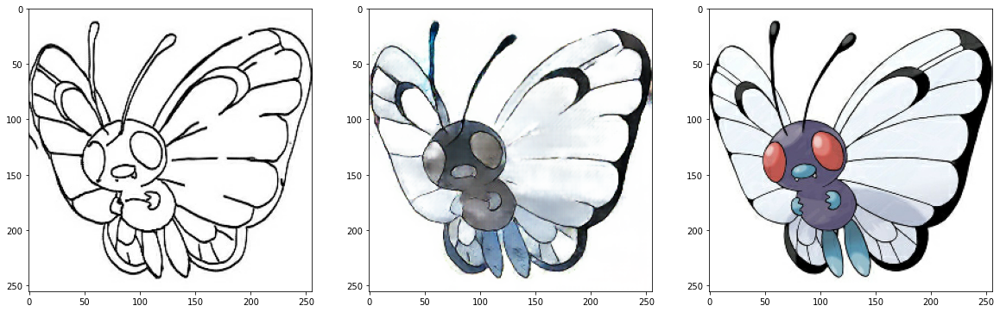

In [100]:
test_ind = 3
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

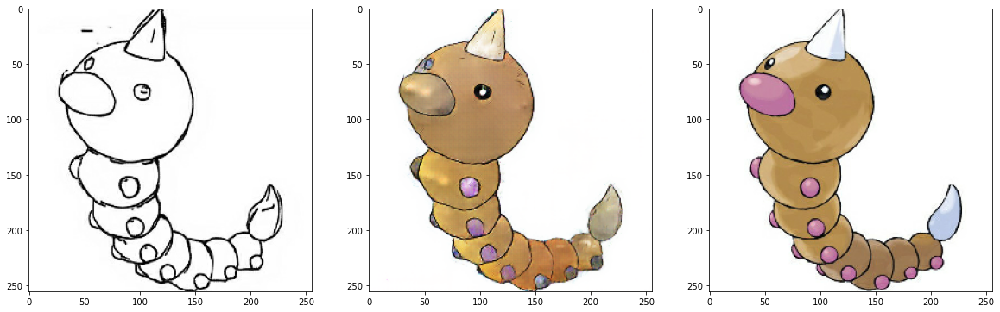

In [101]:
test_ind = 4
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

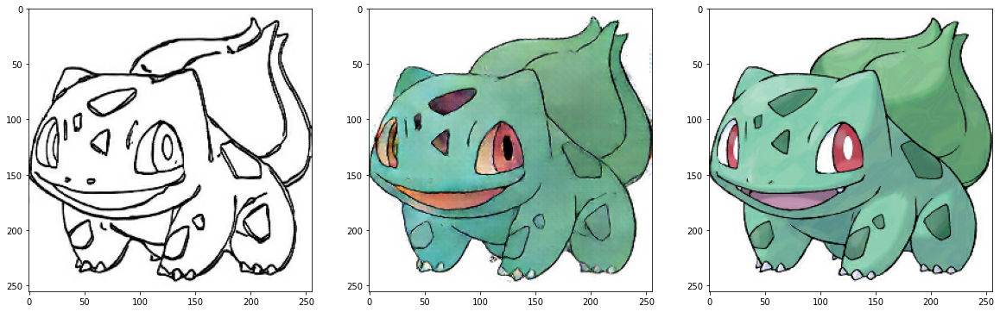

In [102]:
test_ind = 0
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

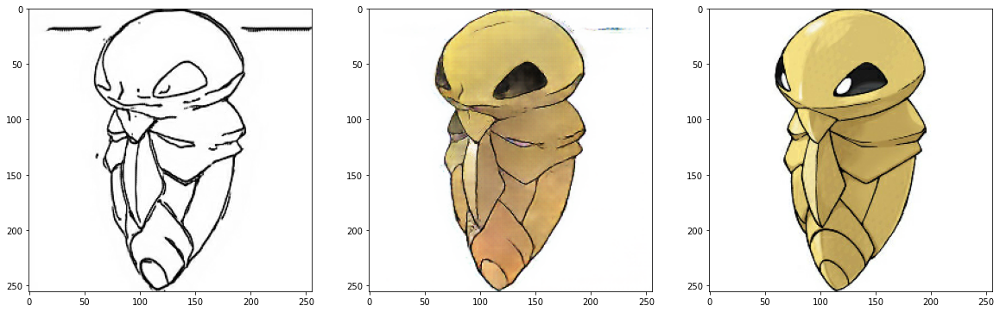

In [103]:
test_ind = 5
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

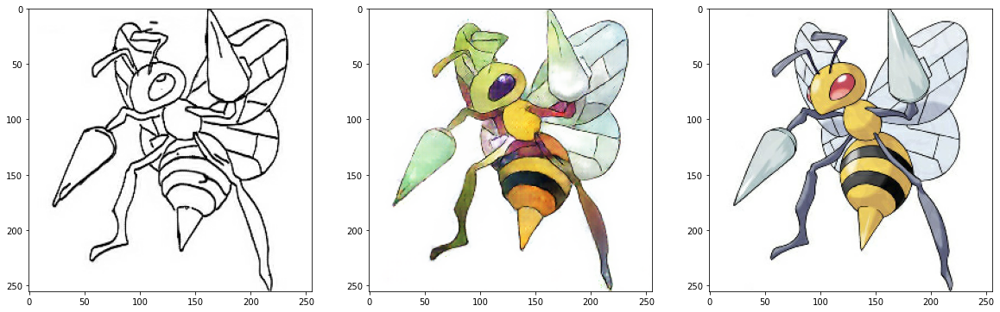

In [104]:
test_ind = 6
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

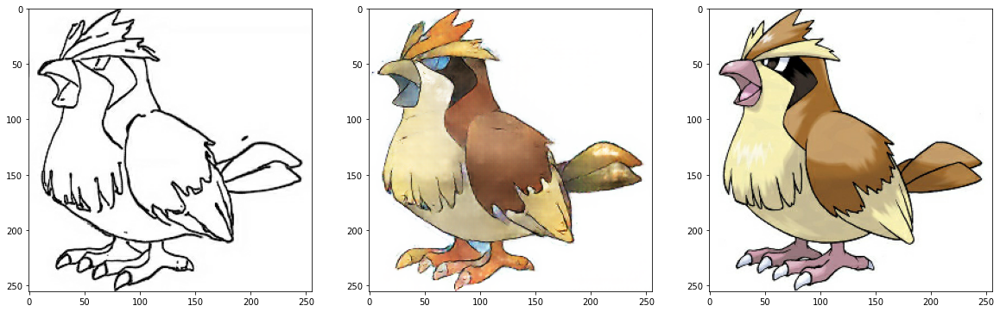

In [105]:
test_ind = 7
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

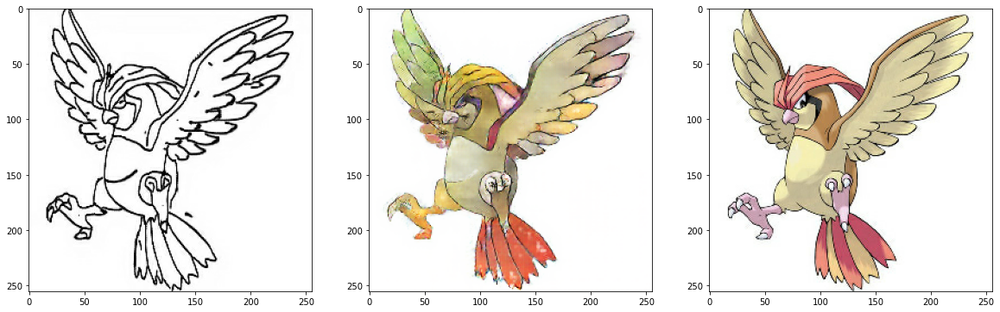

In [106]:
test_ind = 8
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

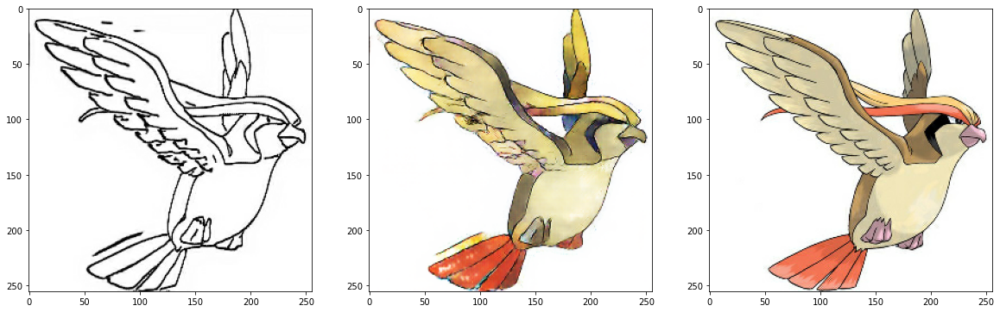

In [107]:
test_ind = 9
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

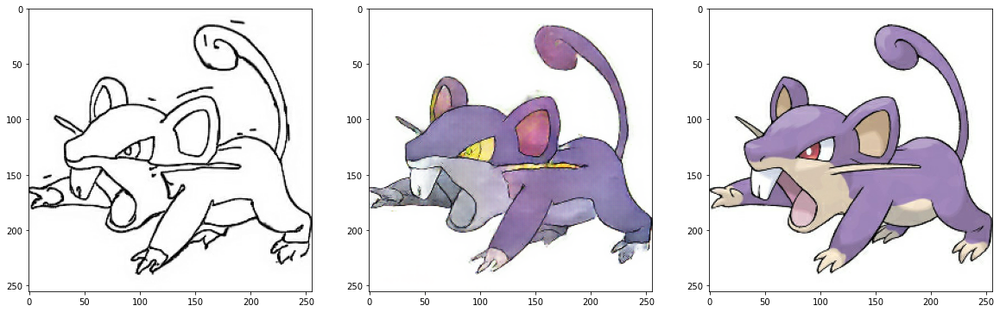

In [108]:
test_ind = 10
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

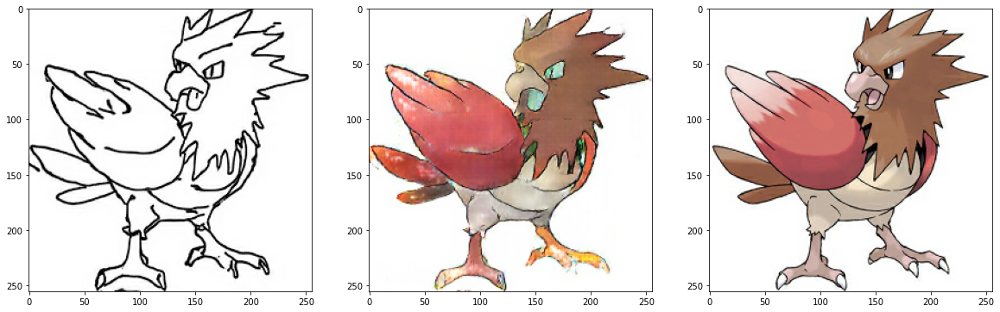

In [109]:
test_ind = 11
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

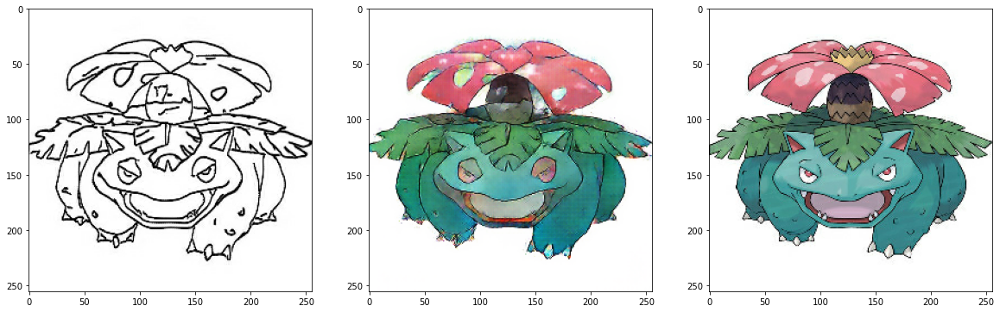

In [110]:
test_ind = 12
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

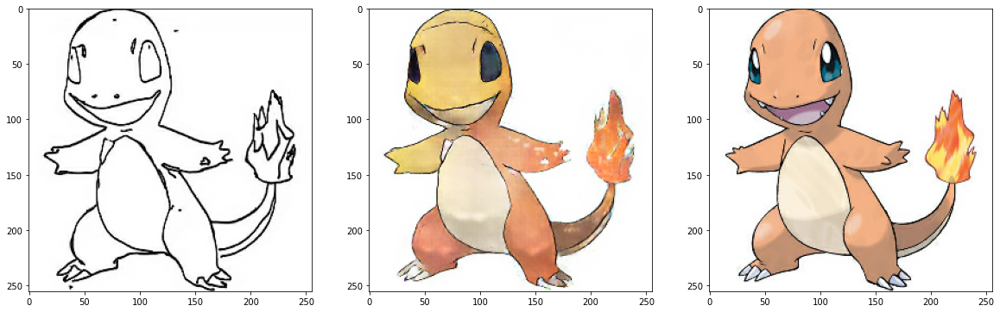

In [111]:
test_ind = 13
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

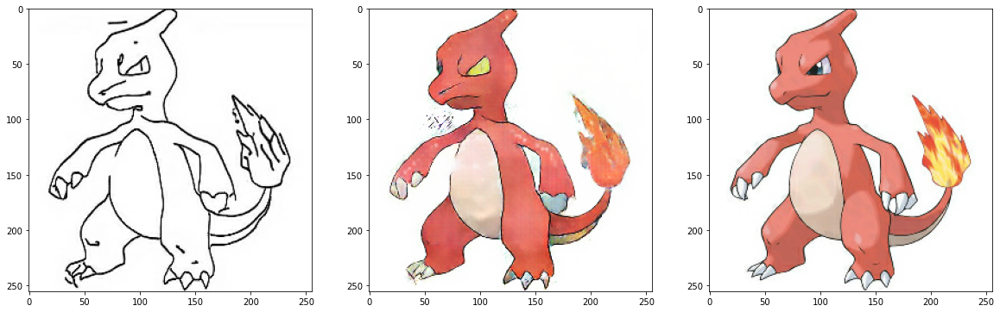

In [112]:
test_ind = 14
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

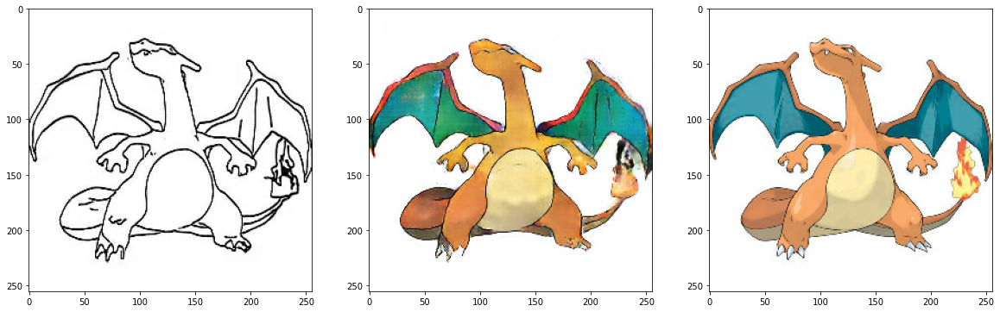

In [113]:
test_ind = 15
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

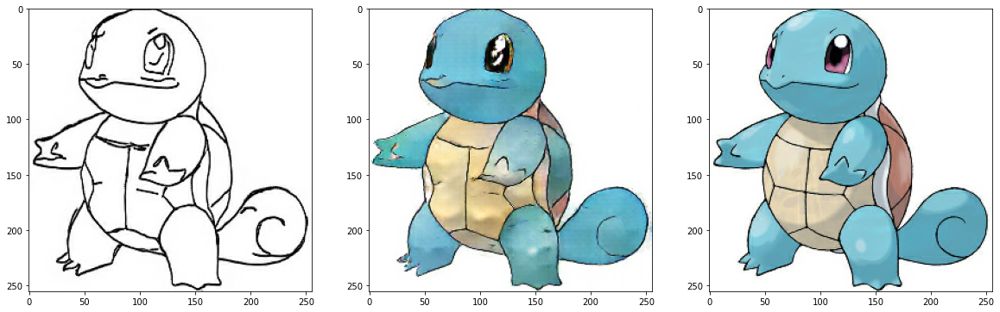

In [114]:
test_ind = 16
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

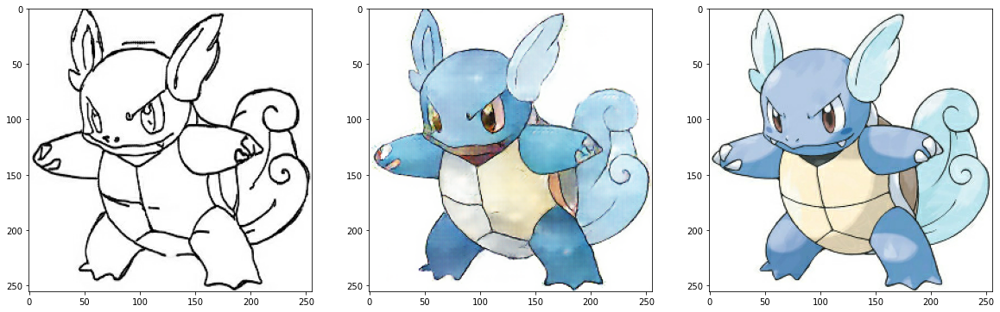

In [115]:
test_ind = 17
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

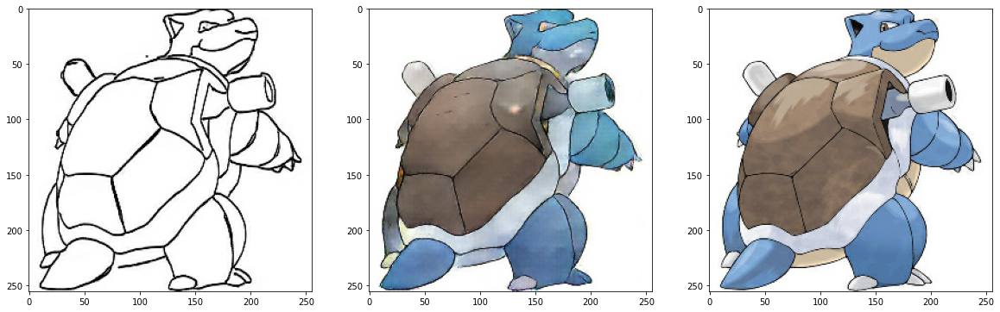

In [116]:
test_ind = 18
f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

이렇게 Encoder-Decoder Generator, U-Net Generator, Discriminator의 구현했음.

## 후기:  
### data augmentation은 크롭과 좌우반전 만 했다.
### loss 값으로 결과를 예측할 수 있는 것도 아니고 돌리는데 시간이 많이 걸려서 코드 손볼 엄두가 나지 않는다.